In [2]:
%load_ext autoreload

In [3]:
%autoreload 2

In [4]:
import json
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
import seaborn as sns
import forgi.graph.bulge_graph as fgb
from forgi.visual.fornac import create_fornac_page_for_structure
from collections import Counter
from utils.plot_rna import plot_rna
from matplotlib import cm
import matplotlib.pyplot as plt

In [5]:
%matplotlib inline

In [6]:
sns.set_theme()

In [7]:
train_data = pd.read_json("../data/train.json",lines=True)

In [8]:
train_data = train_data[train_data['SN_filter'] == 1]

In [9]:
cv_data = pd.read_json("../data/cv_results/val_predictions_samples.json",lines=True)

In [10]:
train_data= train_data[train_data.SN_filter == 1]

In [11]:
cv_data = cv_data.set_index('id')

In [12]:
cv_data = cv_data.loc[train_data.id]

In [13]:
cv_data

,cv_reactivity,cv_deg_Mg_pH10,cv_deg_Mg_50C
id,,,
id_001f94081,"[0.5699316263, 1.9975404739, 0.9827518463, 1.0...","[0.5877674222, 2.8773505688, 0.1046355739, 1.1...","[0.49254250530000004, 3.3555829525, 0.17099425..."
id_006f36f57,"[0.5776184201, 1.4626711607, 1.2376703024, 0.7...","[0.5807642937, 1.5631690025, 0.8221332431, 0.5...","[0.47986751790000004, 1.7057074308, 1.31447970..."
id_00ab2d761,"[0.39180538060000003, 0.9385652542, 0.69601196...","[0.47096791860000004, 1.1713016032999999, 0.86...","[0.4492073059, 1.1074205637, 1.1316534281, 0.5..."
id_00abef1d7,"[0.8687410355, 2.5549361706, 1.7609694004, 1.6...","[0.7444193959000001, 2.4659872055, 0.850591540...","[0.5351625681000001, 2.1383061409, 0.937753915..."
id_00b436dec,"[0.8157044649, 2.0405330658, 1.5231634378, 1.1...","[0.7552591562000001, 3.84623909, 0.97789770360...","[0.5998724699, 3.2485647202, 1.116363287, 0.70..."
...,...,...,...
id_feea15e66,"[0.8260098696, 1.5021158457000001, 1.479484200...","[0.8517192006000001, 3.5131146908, 0.834290385...","[0.6622473598, 2.8114657402, 1.1929264069, 0.6..."
id_ff103a85c,"[0.9183508158, 3.1016004086, 1.610044837, 1.34...","[0.6219378114, 3.6229445933999997, 0.306922048...","[0.5082520843, 3.7460098267, 0.4666113555, 2.0..."
id_ff84602f7,"[0.43540784720000003, 1.4657229185, 1.18024885...","[0.5815179944000001, 2.3264563084, 1.422121405...","[0.4540871084, 2.3900620937, 1.8734945059, 0.0..."


In [14]:
reactivity = np.array(train_data.reactivity.values.tolist())

In [15]:
reactivity_var = np.array(train_data.reactivity_error.tolist())

In [16]:
cv_reactivity = np.array(cv_data.cv_reactivity.values.tolist())[:,:68]

In [17]:
loop_type = np.array(list(map(list, train_data.predicted_loop_type.tolist())))

In [18]:
sequences = np.array(list(map(list, train_data.sequence.tolist())))

In [24]:
deg_mg_ph = np.array(train_data.deg_Mg_pH10.tolist())
cv_deg_mg_ph = np.array(train_data.deg_error_Mg_pH10.tolist())

In [26]:
cv_deg_mg_ph_error = (deg_mg_ph - cv_deg_mg_ph)**2

In [27]:
deg_mg_ph_var = np.array(train_data.deg_error_Mg_pH10.tolist())

In [28]:
deg_mg_50c = np.array(train_data.deg_Mg_50C.tolist())
cv_deg_mg_50c = np.array(cv_data.cv_deg_Mg_50C.tolist())[:,:68]

In [29]:
cv_reactivity_error = (reactivity - cv_reactivity)**2
cv_deg_mg_50c_error = (deg_mg_50c - cv_deg_mg_50c)**2

In [30]:
deg_mg_50c_var = np.array(train_data.deg_error_Mg_50C.tolist())

/media/stepan/files/projects/private/openVaccine/envs/graph/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


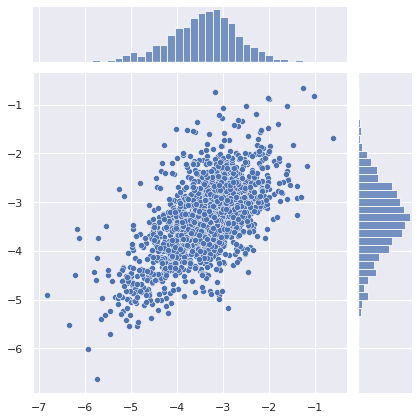

In [31]:
sns.jointplot(np.log(cv_reactivity_error.mean(axis=1)), np.log(cv_deg_mg_50c_error.mean(axis=1)))

/media/stepan/files/projects/private/openVaccine/envs/graph/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


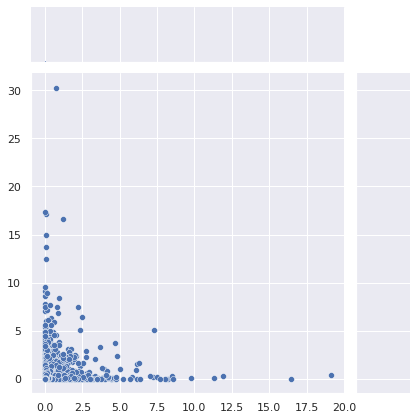

In [98]:
sns.jointplot(cv_reactivity_error.reshape(-1),cv_deg_mg_50c_error.reshape(-1))

In [18]:
loop_types = set(loop_type.reshape(-1))

In [19]:
loop_types

{'B', 'E', 'H', 'I', 'M', 'S', 'X'}

In [80]:
nucs = {"U","A","G","C"}

<AxesSubplot:>

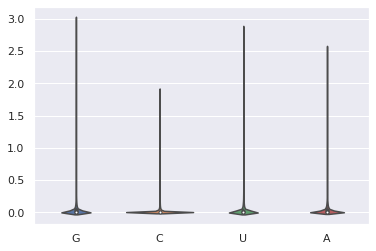

In [83]:
cv_errors_seq = {}
for ty in nucs:
    mask = (sequences[:,:68] == ty)
    cv_errors = cv_reactivity_error[mask]
    cv_errors_seq[ty] = cv_errors
maxsize = max(val.shape[0] for val in cv_errors_seq.values())
cv_errors_seq_pad = {k:np.pad(v,pad_width=(0,maxsize-v.shape[0]), mode='constant', constant_values=np.nan)
                          for k,v in cv_errors_seq.items()}
sns.violinplot(data=(np.log(pd.DataFrame(cv_errors_seq_pad)+1)))

In [86]:
{k:v.mean() for k,v in cv_errors_seq.items()}

{'G': 0.05646035370397802,
 'C': 0.01672107296819432,
 'U': 0.048163225169463704,
 'A': 0.04980363798656979}

In [20]:
cv_errors_looptype = {}
for ty in loop_types:
    mask = (loop_type[:,:68] == ty)
    cv_errors = cv_reactivity_error[mask]
    cv_errors_looptype[ty] = cv_errors

In [21]:
maxsize = max(val.shape[0] for val in cv_errors_looptype.values())a

In [22]:
cv_errors_looptype_pad = {k:np.pad(v,pad_width=(0,maxsize-v.shape[0]), mode='constant', constant_values=np.nan)
                          for k,v in cv_errors_looptype.items()}

In [23]:
{t:i for i, t in enumerate(loop_types)}

{'I': 0, 'E': 1, 'M': 2, 'S': 3, 'H': 4, 'X': 5, 'B': 6}

<AxesSubplot:>

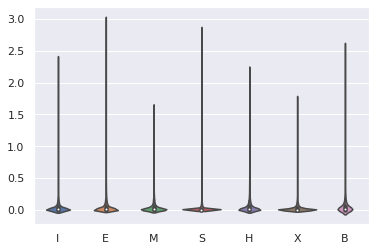

In [24]:
sns.violinplot(data=(np.log(pd.DataFrame(cv_errors_looptype_pad)+1)))

In [51]:
np.where(cv_reactivity_error == cv_reactivity_error.max())

(array([1185]), array([1]))

<AxesSubplot:>

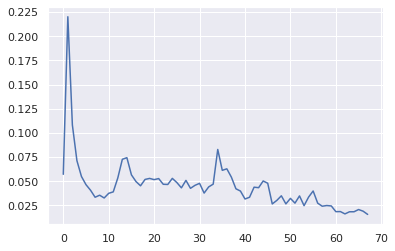

In [155]:
sns.lineplot(y=cv_reactivity_error.mean(axis=0),x=range(68))

In [ ]:
plot_rna()

In [34]:
def plot_errors(i, true_vals=reactivity, cv_vals=cv_reactivity, true_var=reactivity_var, errors = cv_reactivity_error):
    errors = errors[i]
    max_error = errors.max()
    true_val = true_vals[i]
    cv_val = cv_vals[i]
    
    colors = [cm.Reds(c*0.8)[:3] if diff >0 else cm.Blues(c*0.8)[:3]
              for c,diff in zip(errors/max_error, true_val-cv_val)] + [(1,1,1)]*(107-68)
    sequence,structure = train_data.iloc[i][['sequence','structure']].values
    fa = '\n'.join([">0",sequence,structure])
    bg, = fgb.BulgeGraph.from_fasta_text(fa)

    fig, (ax,ax2) = plt.subplots(figsize=(30,14),ncols=2)
    plot_rna(bg,ax, text_kwargs={"fontweight":"black"}, lighten=0.7,
                 backbone_kwargs={"linewidth":3},color=True
             , colors=colors
            )
    print(cv_val)
    ax2.plot(range(1,69), cv_val,label='pred')
    ax2.plot(range(1,69), true_val,label='true')
#     ax2.plot(range(1,69), true_var[i], label='var')
    ax2.legend()
    plt.show()

590 0.2869802062355837


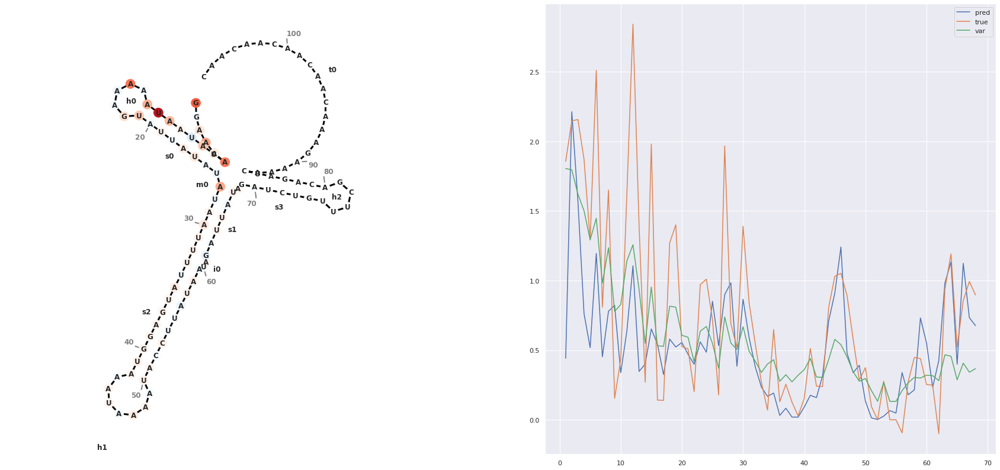

399 0.34753432813456825


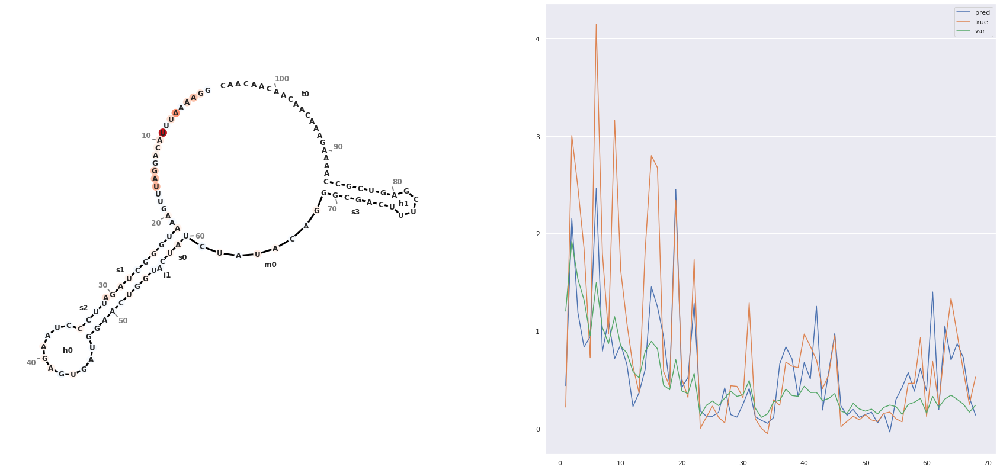

298 0.3805562198513129


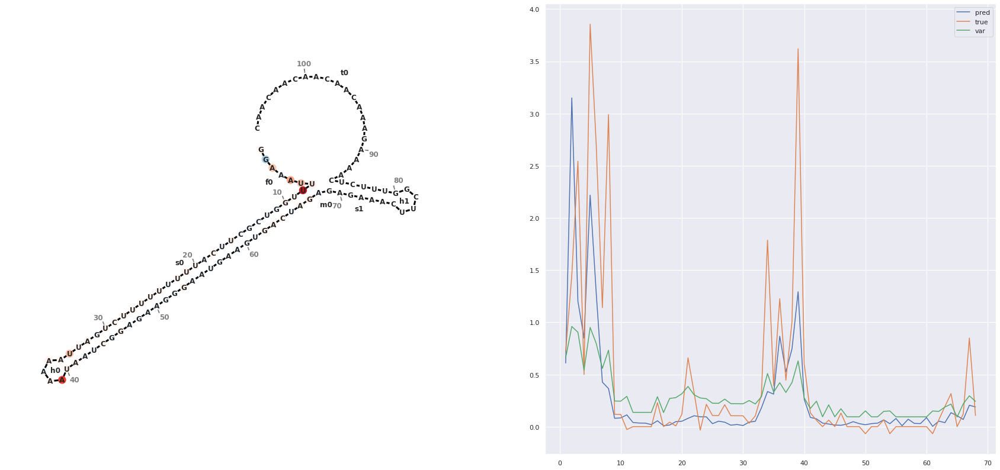

1380 0.35442794621806845


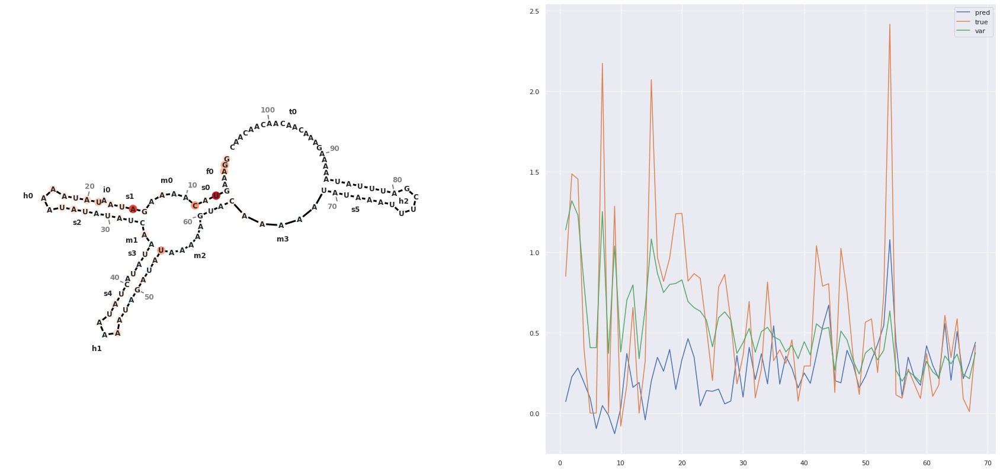

1150 0.41331054995956035


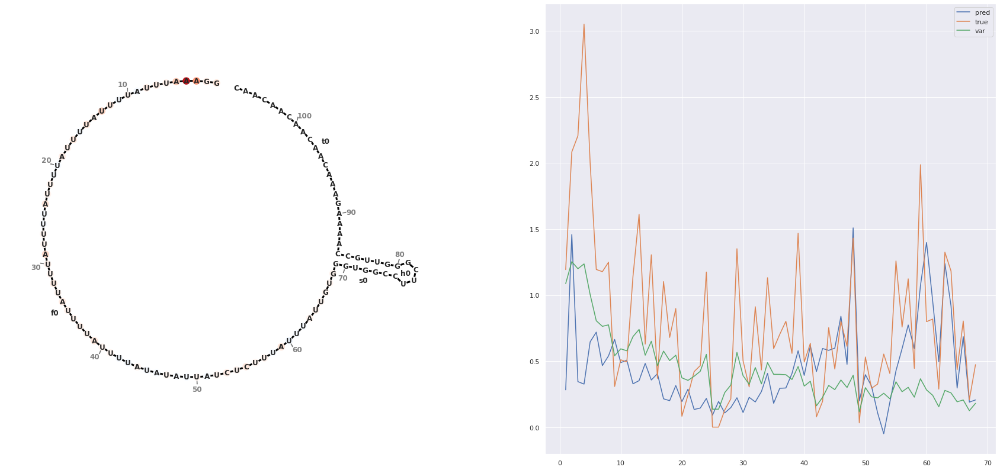

661 0.5057680963445518


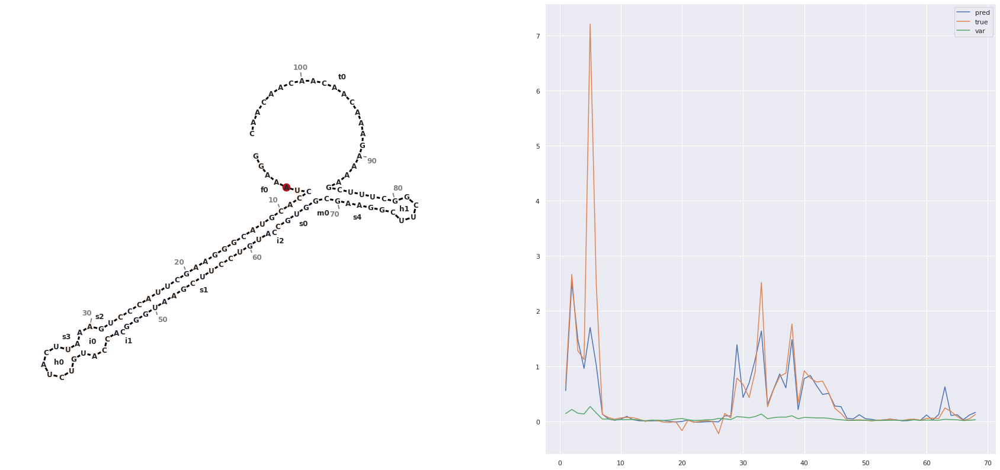

1478 0.5449053877515907


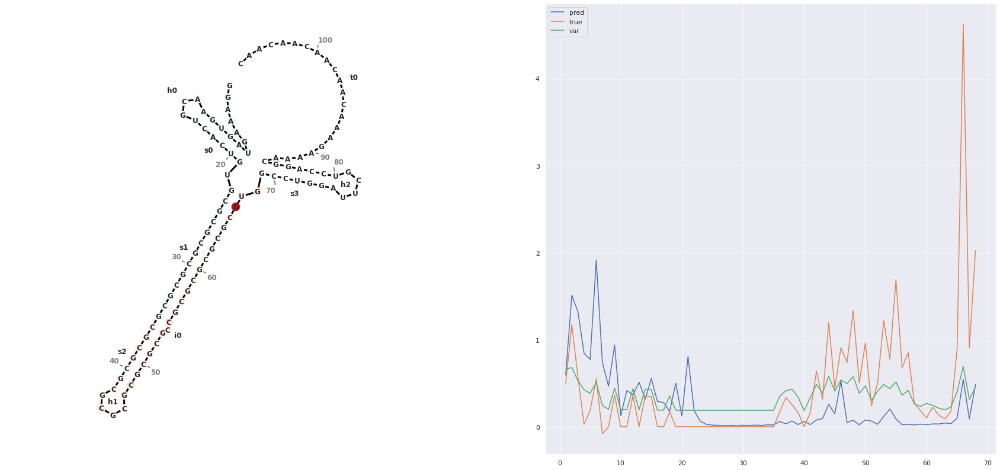

1466 0.48583201090288086


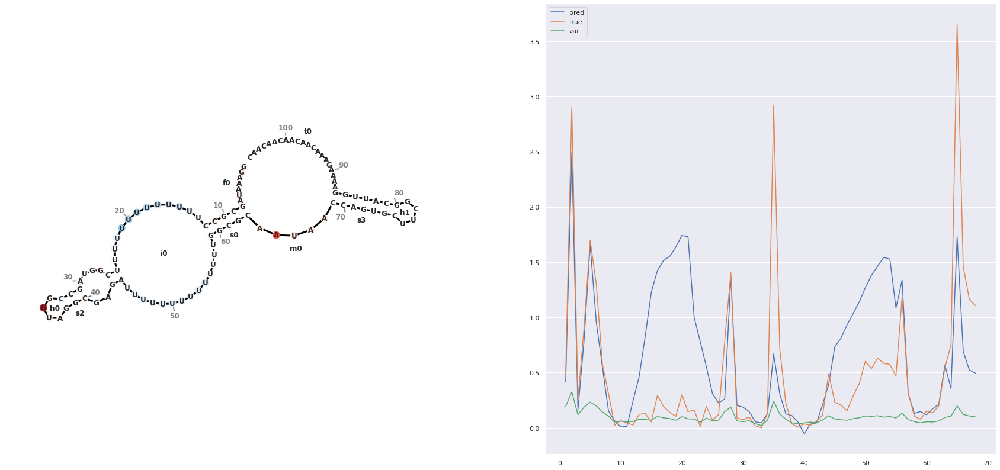

1439 0.5034245161623319


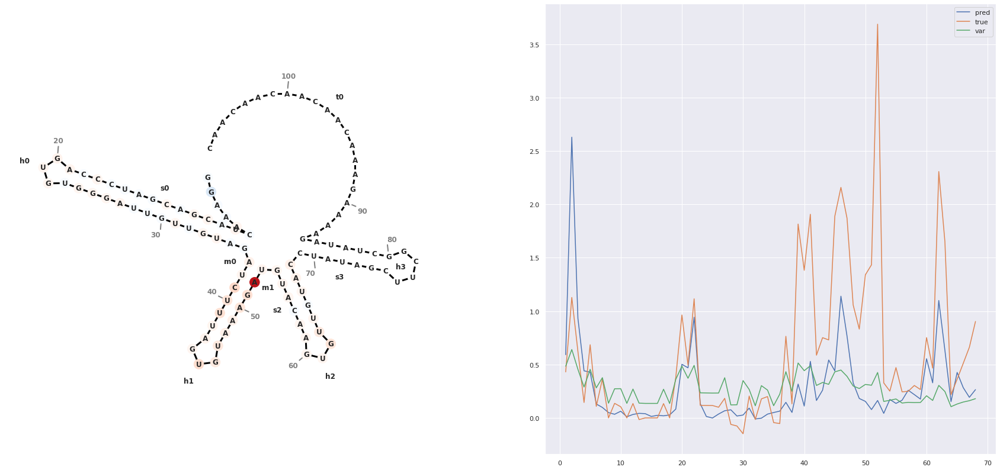

In [161]:
cv_deg_mg_50c_error_mean_err = cv_deg_mg_50c_error.mean(1)
for i in np.argpartition(cv_deg_mg_50c_error_mean_err, 1580)[1580:]:
    print(i, cv_deg_mg_50c_error_mean_err[i])
    plot_errors(i, deg_mg_50c, cv_deg_mg_50c, deg_mg_50c_var, cv_deg_mg_50c_error)

1149 1.0992017964705878
[0.5677 0.8432 0.2925 0.214  0.1578 0.1323 0.1754 0.205  0.1695 0.183
 0.1462 0.2049 0.219  0.2392 0.1633 0.2674 0.0517 0.0517 0.1838 0.2308
 0.3424 0.1458 0.1744 0.13   0.1124 0.0891 0.1    0.0992 0.0985 0.0868
 0.1562 0.0946 0.1176 0.1015 0.0679 0.0917 0.0808 0.0693 0.2013 0.1526
 0.2891 0.1434 0.2037 0.2406 0.1663 0.092  0.0613 0.0445 0.0702 0.0401
 0.0356 0.0525 0.0667 0.0693 0.0345 0.048  0.0384 0.0897 0.0658 0.0693
 0.0591 0.0709 0.0727 0.031  0.0556 0.091  0.0967 0.081 ]


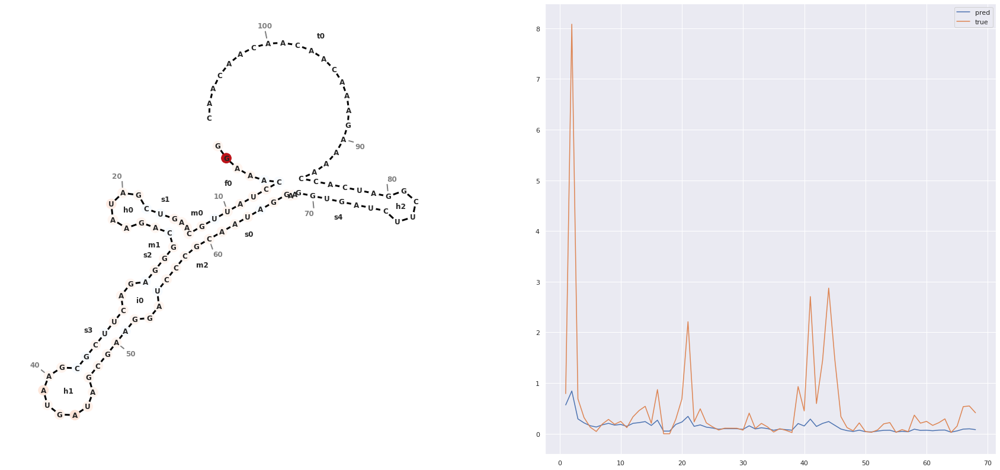

1575 1.1378968535294116
[0.188  0.2195 0.1905 0.1935 0.2497 0.0367 0.0457 0.0425 0.0596 0.0514
 0.0453 0.0321 0.0415 0.0333 0.0419 0.0391 0.044  0.0399 0.0379 0.0229
 0.0228 0.0268 0.0267 0.024  0.0337 0.0264 0.031  0.0389 0.0332 0.0855
 0.0696 0.0837 0.1065 0.0846 0.0819 0.0262 0.0285 0.022  0.0247 0.0199
 0.0201 0.0317 0.0131 0.0141 0.012  0.024  0.0526 0.0626 0.0313 0.0189
 0.0151 0.0166 0.0167 0.0227 0.0265 0.0563 0.0688 0.0567 0.0534 0.0375
 0.0224 0.0143 0.0205 0.0171 0.0153 0.0238 0.0224 0.0568]


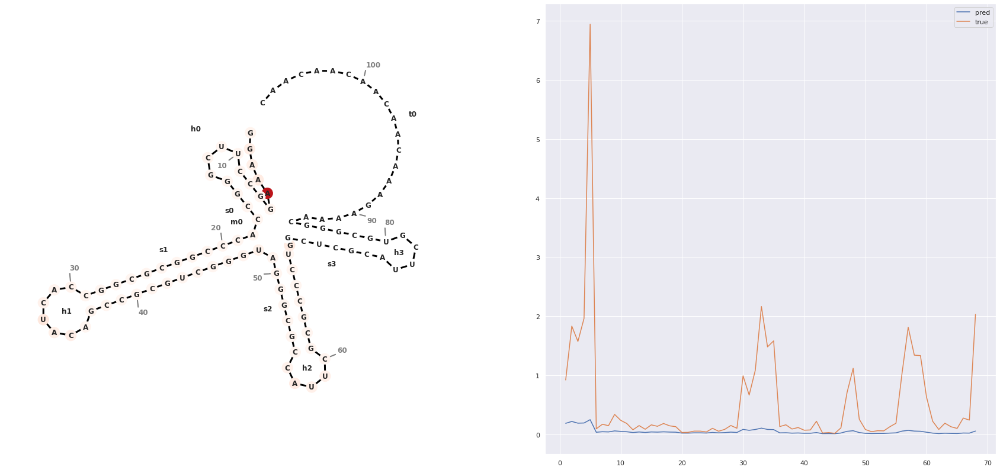

1294 1.1956670101470588
[0.4329 0.5496 0.2651 0.323  0.5085 0.2753 0.3009 0.1651 0.1224 0.1011
 0.1366 0.1737 0.3815 0.1632 0.1856 0.1523 0.0958 0.0705 0.1256 0.2732
 0.2102 0.2372 0.268  0.2058 0.1187 0.1793 0.0968 0.0793 0.0665 0.0556
 0.0494 0.0701 0.1613 0.1192 0.1324 0.1004 0.0784 0.0605 0.0283 0.0235
 0.0462 0.0684 0.1007 0.0773 0.0669 0.0733 0.0637 0.0741 0.0351 0.0411
 0.0287 0.0225 0.0248 0.0287 0.0247 0.0658 0.026  0.0243 0.0298 0.0167
 0.0154 0.0205 0.0281 0.0219 0.0511 0.0235 0.0275 0.0209]


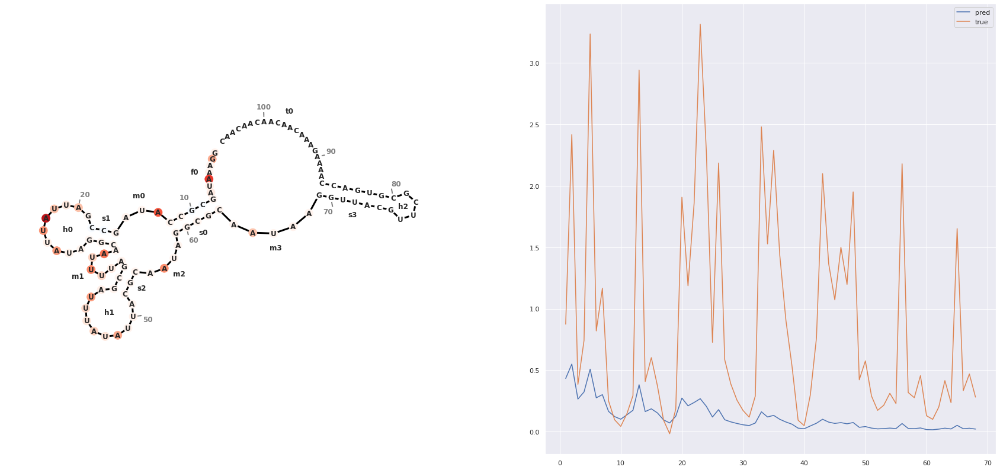

1273 1.1983421848529416
[0.3598 0.5858 0.3023 0.4635 0.2805 0.3262 0.2399 0.1905 0.1586 0.1956
 0.113  0.2187 0.1089 0.1306 0.4151 0.3642 0.1721 0.1104 0.0826 0.0825
 0.0968 0.0882 0.0949 0.1273 0.0969 0.0562 0.1062 0.0997 0.0657 0.0978
 0.0646 0.0862 0.072  0.1    0.1429 0.1129 0.067  0.0782 0.1011 0.0615
 0.0733 0.1852 0.2944 0.1735 0.1431 0.11   0.035  0.0363 0.0422 0.0417
 0.0277 0.0404 0.035  0.0311 0.0408 0.0486 0.031  0.0444 0.0387 0.0493
 0.0591 0.0626 0.0536 0.068  0.0629 0.0672 0.0679 0.0693]


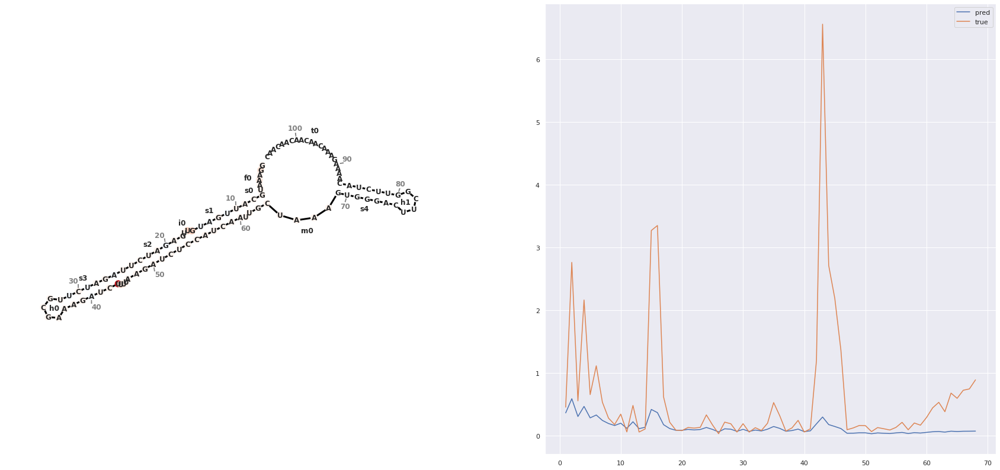

536 1.2696579042647063
[0.1363 0.1998 0.111  0.0881 0.0849 0.0841 0.0968 0.1003 0.0564 0.0598
 0.0489 0.0736 0.0674 0.0552 0.0638 0.0546 0.0488 0.0382 0.0497 0.0375
 0.0487 0.0234 0.0522 0.029  0.032  0.0525 0.0509 0.0401 0.0356 0.0901
 0.0671 0.1247 0.0585 0.0714 0.0784 0.0352 0.0391 0.0298 0.0183 0.0305
 0.047  0.0367 0.0244 0.0173 0.0206 0.0401 0.0806 0.0558 0.0414 0.0655
 0.0376 0.0624 0.0292 0.0275 0.0219 0.0203 0.0415 0.0626 0.1039 0.0225
 0.0204 0.0264 0.0235 0.0254 0.0355 0.0286 0.0214 0.0247]


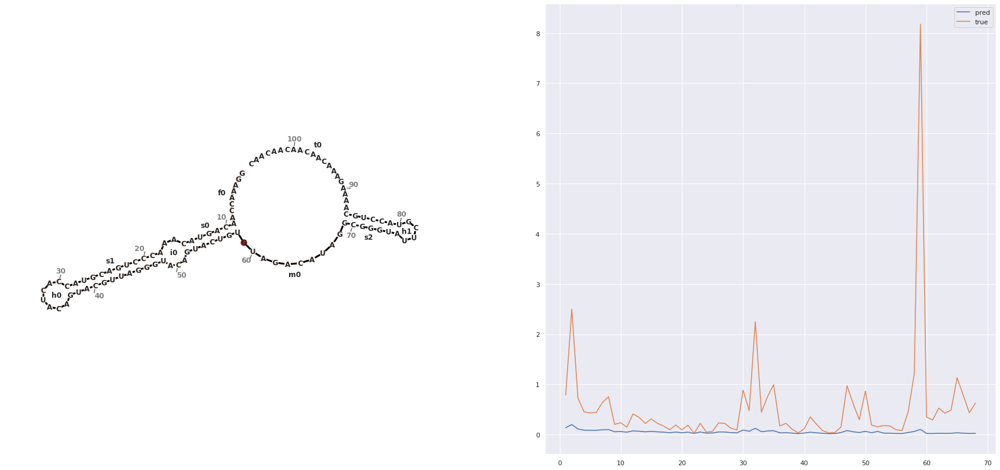

1266 1.2181338010294118
[0.1481 0.254  0.2487 0.1622 0.1663 0.1693 0.1255 0.2525 0.1886 0.2871
 0.3547 0.1243 0.0862 0.1518 0.1084 0.0554 0.0784 0.081  0.1139 0.0426
 0.062  0.0628 0.045  0.0349 0.0525 0.0535 0.0351 0.0375 0.0849 0.063
 0.0907 0.0578 0.0479 0.0591 0.0637 0.0557 0.0804 0.0467 0.0572 0.0532
 0.0732 0.048  0.0543 0.0341 0.036  0.0379 0.0627 0.0286 0.0384 0.0423
 0.0258 0.0477 0.0632 0.0335 0.0722 0.0329 0.0174 0.0281 0.0333 0.0492
 0.0546 0.0279 0.0524 0.0677 0.0347 0.0626 0.0231 0.039 ]


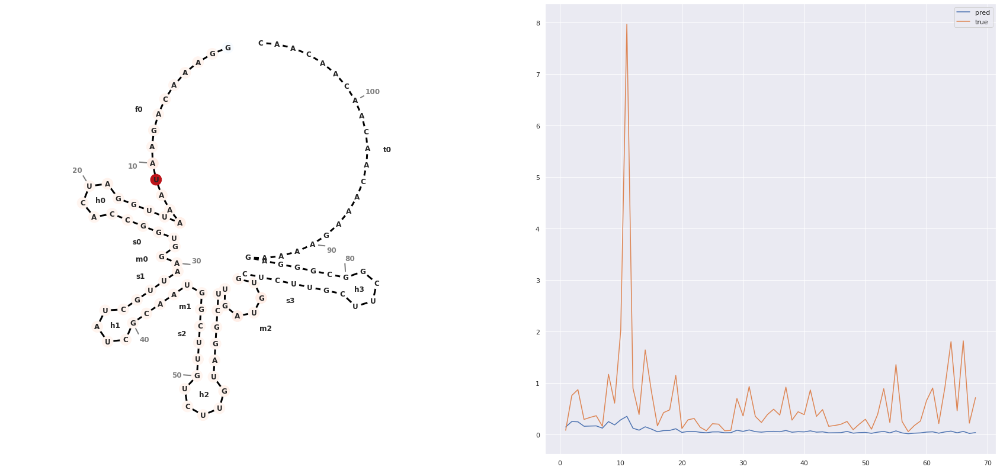

680 1.3107079410294116
[2.7648 2.3441 1.6334 0.5673 0.5599 0.6415 0.6285 0.7277 0.5899 0.2953
 0.5783 0.2895 0.7469 0.9113 0.873  0.6726 0.3643 0.1827 0.1827 0.43
 0.3514 0.1798 0.1762 0.1831 0.349  0.4579 0.3973 0.4333 0.376  0.3683
 0.1553 0.3598 0.3267 0.8046 0.2317 0.2155 0.1938 0.1743 0.1305 0.0708
 0.0739 0.2636 0.204  0.1877 0.1874 0.1539 0.1808 0.1567 0.2939 0.2426
 0.1144 0.1832 0.3766 0.2334 0.1143 0.1324 0.1196 0.1027 0.1191 0.1294
 0.1933 0.1641 0.165  0.2283 0.1304 0.0967 0.1267 0.1452]


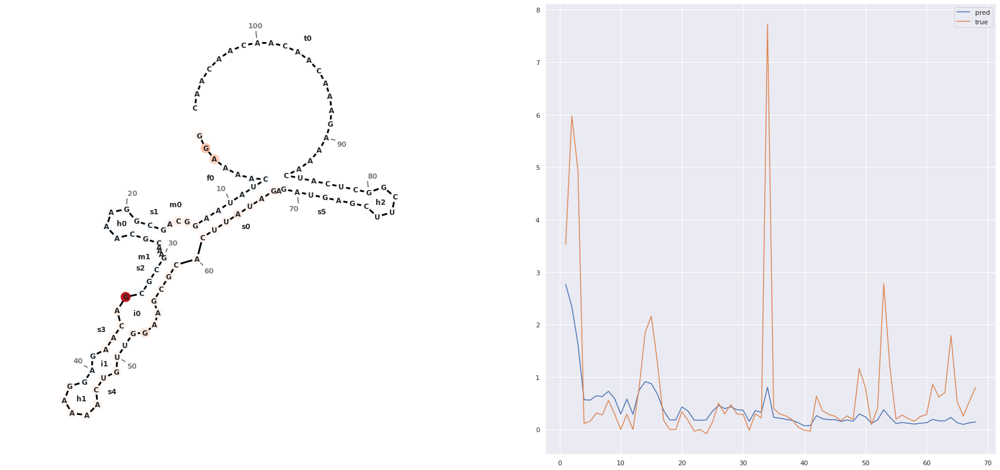

1118 1.4564887857352942
[0.368  0.4756 0.3202 0.3767 0.3249 0.1497 0.1567 0.1229 0.108  0.1211
 0.1063 0.1193 0.087  0.1047 0.3519 0.3123 0.1779 0.1116 0.077  0.0824
 0.1043 0.068  0.0599 0.0678 0.0673 0.0593 0.0964 0.0987 0.0707 0.1065
 0.0232 0.0982 0.0821 0.0923 0.111  0.0742 0.0428 0.0637 0.0682 0.08
 0.0622 0.071  0.2848 0.2125 0.1409 0.0816 0.0477 0.0268 0.0349 0.0376
 0.0228 0.0356 0.0339 0.0204 0.0228 0.0314 0.0233 0.0261 0.0289 0.046
 0.0495 0.0326 0.0415 0.0505 0.0581 0.0663 0.0627 0.0588]


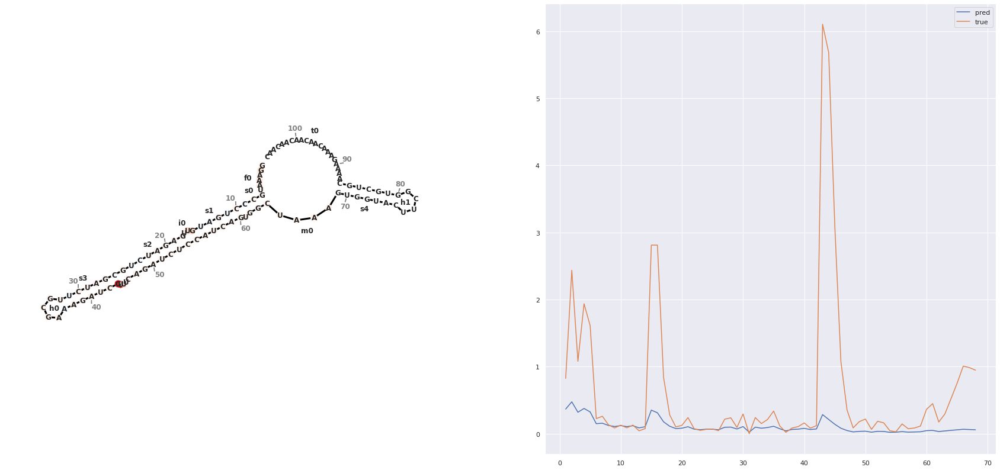

828 1.1435732901470586
[0.1238 0.193  0.1144 0.0879 0.0927 0.0899 0.0853 0.097  0.0683 0.0541
 0.0598 0.0832 0.0694 0.0452 0.0681 0.0637 0.0587 0.0595 0.0622 0.0376
 0.0529 0.0204 0.0571 0.0324 0.0363 0.0673 0.0493 0.0476 0.0346 0.091
 0.0728 0.137  0.0656 0.0784 0.0918 0.0364 0.0416 0.035  0.0219 0.0318
 0.0467 0.0442 0.0247 0.0228 0.024  0.0451 0.0845 0.0562 0.0532 0.0693
 0.0396 0.0615 0.0327 0.0275 0.0293 0.0251 0.0441 0.0432 0.1204 0.0328
 0.0252 0.0307 0.0287 0.0298 0.0484 0.0287 0.0235 0.0269]


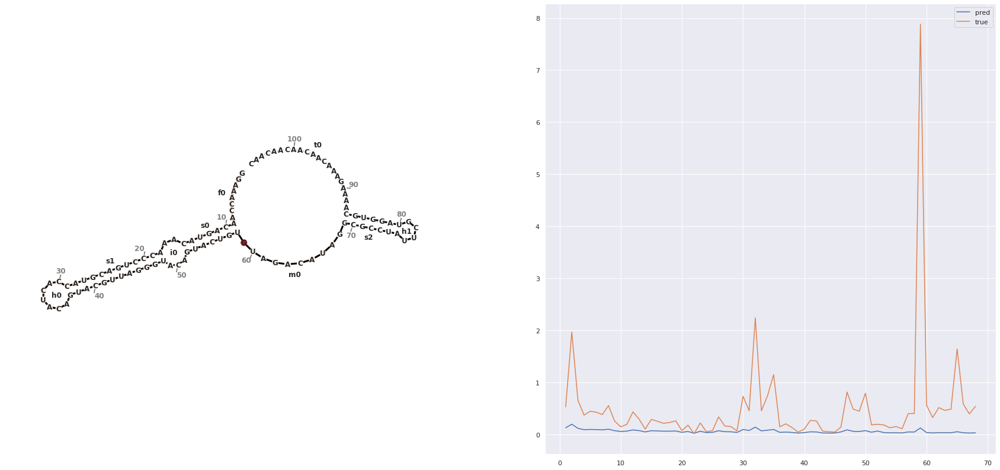

In [216]:
cv_deg_mg_ph_error_mean_err = cv_deg_mg_ph_error.mean(1)
for i in np.argpartition(cv_deg_mg_ph_error_mean_err, 1580)[1580:]:
    print(i, cv_deg_mg_ph_error_mean_err[i])
    plot_errors(i, deg_mg_ph, cv_deg_mg_ph, deg_mg_ph_var, cv_deg_mg_ph_error)

In [164]:
np.argpartition(mean_err,1300)[1300:1320]

array([ 808,  606,    6, 1034,   29,  866, 1243, 1423,  772,  214,    8,
        998,    9, 1313, 1302,  153,  775, 1297,   82,  338])

1242 4.206630001400848
[0.56790656 1.16176057 1.11530399 0.78336167 0.96927702 0.62545717
 0.72605419 0.65372449 0.59442741 0.39559495 0.40392476 0.13147804
 0.11897161 0.11353865 0.03527046 0.09172333 0.93249619 0.68612337
 0.14072959 0.1024463  0.55315596 0.52288467 0.02546209 0.10101645
 0.06390428 0.05342231 0.21602622 0.19741963 0.15164599 0.39238334
 0.55814743 0.30957699 0.13039929 0.2590892  0.61397344 0.27878845
 0.51720095 0.79295689 0.45165131 0.9467271  0.49391276 0.3761352
 0.32429558 0.29692581 0.05814024 0.23173733 0.24210027 0.16548644
 0.10481103 0.08154255 0.52185208 0.81164819 0.04789774 0.09103051
 0.80564541 0.36498079 0.07260755 0.10886245 0.06573071 0.12919363
 0.24683295 0.74832106 0.67807287 0.33417264 0.74494284 0.46411929
 0.19918993 0.23827215]


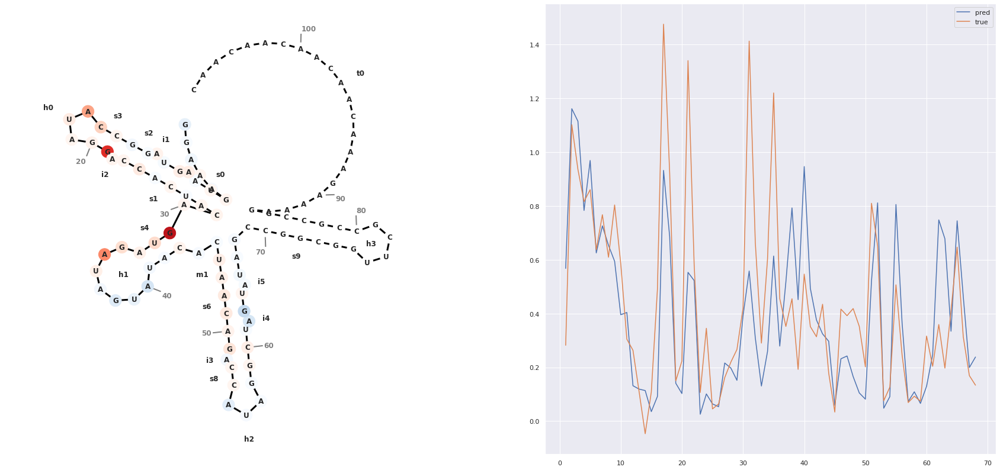

144 4.215642299899782
[0.46904686 1.03298044 0.97627568 0.50808889 0.07671911 0.06270701
 0.04761323 0.01315797 0.05793067 0.28773135 1.40252936 1.24680555
 0.94111788 0.99677038 0.94133019 0.08097345 0.02779135 0.02818201
 0.01498209 0.04321825 0.10597236 0.73001897 0.334824   0.19874367
 0.20581202 0.36119276 0.52123976 0.53595966 0.58368373 0.68202305
 0.14741561 0.07010377 0.4470787  0.60106844 0.32355309 0.36394352
 0.95307738 1.18786669 0.95533466 0.80091697 0.62254679 0.5629344
 0.78108615 0.44807369 0.2531659  0.45899218 0.43590927 0.2035147
 0.03282538 0.01843849 0.03567929 0.09210238 0.04880109 0.21890828
 0.78550309 0.47145402 0.52789378 0.23242724 0.32066029 0.22149199
 0.05634122 0.14354956 0.04695804 0.05420364 0.10541251 0.19439316
 0.14362332 0.28133887]


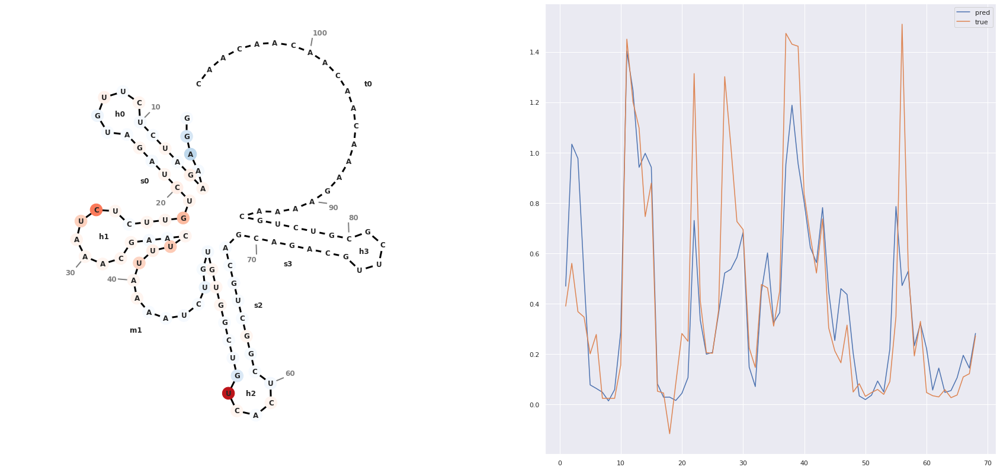

316 4.224863062022341
[0.67897761 1.78603971 1.13050783 0.90726376 0.2060993  0.05531643
 0.02546917 0.01180497 0.00572133 0.00909387 0.00764821 0.01700088
 0.18282284 2.09988689 0.93845749 1.16929018 0.96300864 0.08868121
 0.04389846 0.02867786 0.01517766 0.04727985 0.01703385 0.0059968
 0.35818714 0.34754783 0.05662533 0.01990476 0.01601081 0.0121245
 0.016325   0.01347183 0.01373006 0.07991759 1.89102828 0.83261937
 0.68683898 0.45985508 0.03670886 0.032885   0.00478308 0.00488036
 0.00998917 0.01697779 0.00351992 0.11505079 0.63609868 0.0247026
 0.00883955 0.00364595 0.00836141 0.00893917 0.00384735 0.02393958
 0.03794853 0.94877368 2.5567379  0.98247623 0.81490678 0.0448878
 0.01583416 0.02269242 0.00947856 0.00991395 0.00809408 0.02624845
 0.13139269 0.22386681]


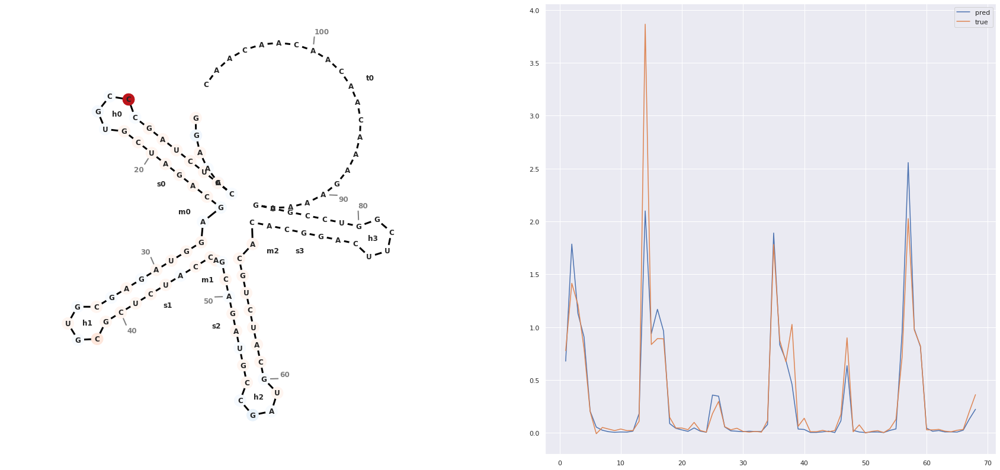

847 4.228067760305079
[0.09179403 0.41604206 0.4217912  0.43700746 0.20381838 0.27900791
 0.28682482 0.16145378 0.33472347 0.27515408 0.18929684 0.31174552
 0.35313985 0.1897279  0.28874373 0.23506413 0.14711    0.30795354
 0.34987572 0.17502511 0.27567431 0.22931585 0.14341086 0.32072487
 0.36055455 0.17977965 0.2975944  0.24612753 0.15593526 0.36245483
 0.39376333 0.19610706 0.33410618 0.27254972 0.16774093 0.38911846
 0.41517505 0.21382585 0.3713347  0.29704025 0.18719569 0.41972405
 0.42532077 0.23122597 0.3927905  0.32630417 0.23316917 0.46543273
 0.44349432 0.26413891 0.4355059  0.38133594 0.32231373 0.59816444
 0.53578103 0.34089252 0.48719659 0.45410478 0.43026862 0.7774573
 0.6436466  0.45512959 0.50207621 0.41059947 0.51973581 0.46902716
 0.57837242 0.88744205]


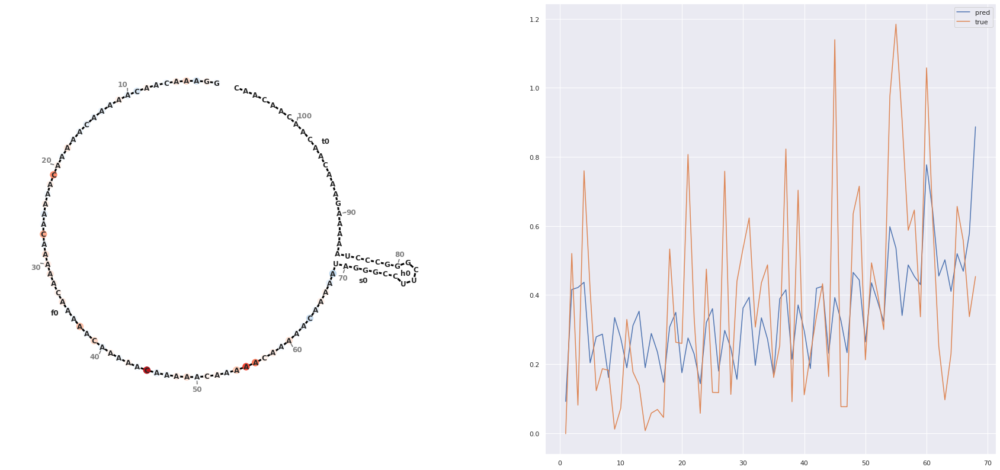

242 4.239647672178094
[0.88548321 2.41926455 1.48464477 1.35891056 1.08512759 1.09793663
 0.93651944 0.6697132  0.22541766 0.06935889 0.0556009  0.0681948
 0.03227656 0.00788664 0.00891543 0.00665704 0.02693372 1.22912037
 1.68191433 1.69959581 2.59202933 0.96274722 0.03963429 0.01047341
 0.01193823 0.11245736 0.72169203 0.29349792 0.13095486 0.06197239
 0.09426041 0.76469892 0.70803231 0.28614974 0.17600217 0.4319005
 0.08512346 0.19362241 1.38211346 0.63689137 0.30973059 0.07791322
 0.17666225 0.43712124 0.11633928 0.16279124 0.03098352 0.04709373
 0.4518539  0.86666518 0.93985939 0.72177762 0.87544721 0.60681254
 0.0734131  0.12679812 0.2646459  0.34542686 0.07166174 0.17727359
 0.40026614 0.14556526 0.23986888 0.21555865 0.30207431 0.05029572
 0.20433126 0.1309728 ]


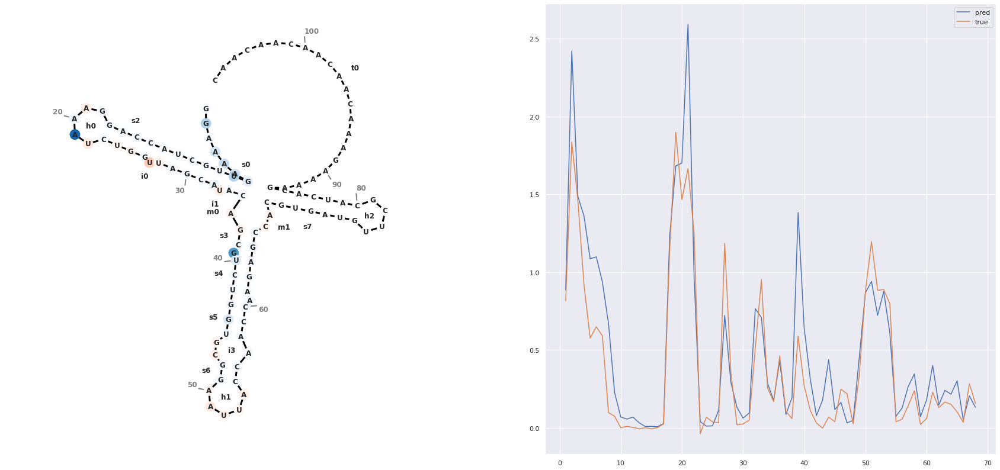

192 4.2472329316988215
[0.62128139 1.26202774 1.44682419 0.96090037 0.72233152 0.59577686
 0.84486949 0.109915   0.08761734 0.04347488 0.01470349 0.06674826
 0.22041065 0.10218319 0.08340985 0.01573323 0.01495396 0.15285829
 0.65118301 1.30270243 0.1107899  0.03411891 0.05405354 0.08749102
 0.01790302 0.23564659 0.06099609 0.02555458 0.0437455  0.05332388
 0.01185826 0.01912361 0.27526826 1.25815129 1.66280425 0.25538933
 0.24780124 0.03671878 0.05770418 0.00188852 0.0092277  0.23083529
 0.27914786 0.04703835 0.08460925 0.05799134 0.03152652 0.02308439
 0.13017836 0.79902756 1.29621291 0.19145355 0.28258279 0.07971232
 0.07506652 0.10015682 0.03950127 0.13630697 0.4242242  0.80541676
 0.30018124 0.03115649 0.04308338 0.0479412  0.06375312 0.12403052
 0.66997433 0.71674389]


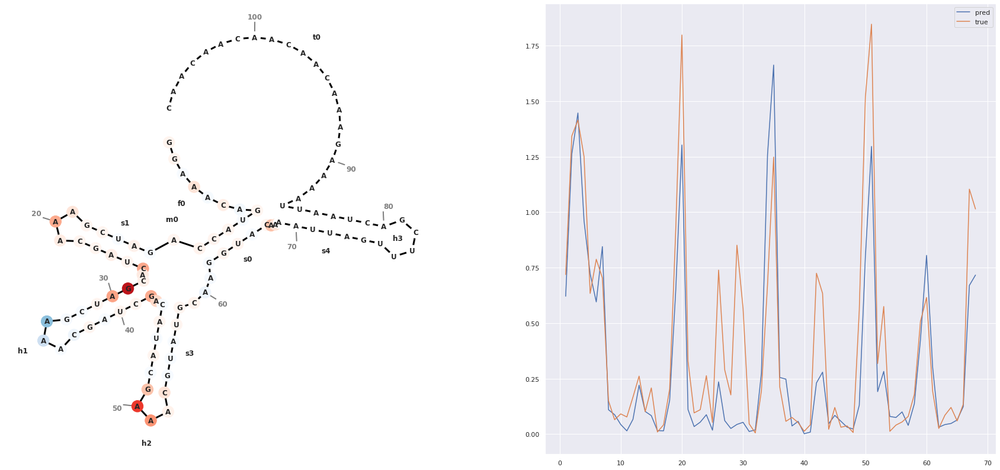

772 4.23543257846344
[0.76660794 2.32612801 1.28676188 1.19726324 1.83366215 1.05758429
 0.35902181 1.82048118 0.85652852 0.770275   1.04007554 1.14194667
 0.32114905 0.05507104 0.15603116 0.12425973 0.06381839 0.11854195
 0.12601267 0.48836929 0.28024766 0.23675022 0.13922931 0.07501616
 0.19518465 0.11484379 0.05634175 0.04048098 0.15236384 0.36483645
 0.28121975 0.1365598  0.9043557  1.07376921 2.25651312 0.39229882
 0.55067337 0.22348234 0.31555599 0.82018501 0.42044309 0.06158359
 0.0672548  0.11827864 0.5711658  1.50981951 0.5816561  0.10111587
 0.038574   0.03445576 0.18656459 0.1329588  0.03960763 0.03084672
 0.18897954 0.47454557 0.60363656 0.29786116 0.16002636 0.35835648
 0.36381906 0.36701596 0.2358491  0.15522678 0.11902463 0.09256732
 0.04480487 0.16553052]


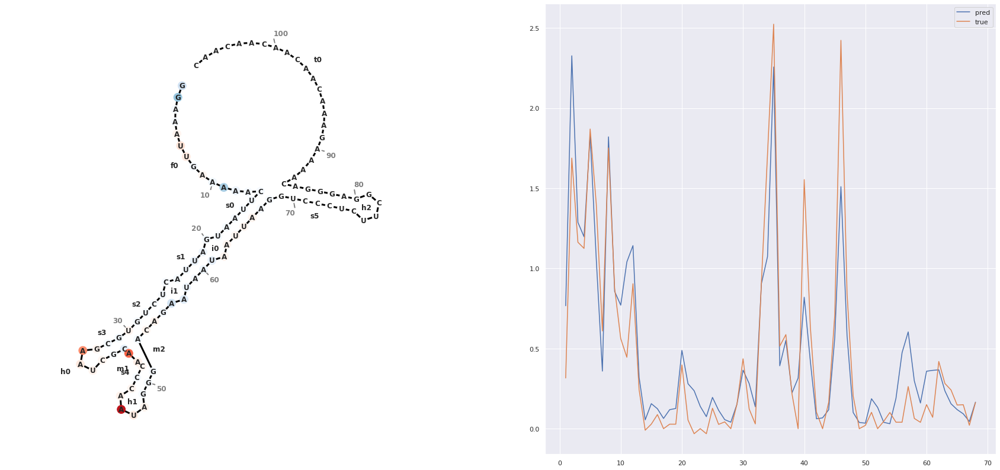

13 4.230656075876067
[0.38616475 0.8117733  0.8252281  0.58151406 0.18137181 0.44439304
 0.13778777 0.26308963 0.57495999 0.55366516 0.7462725  0.22156562
 0.0739857  0.23737822 0.23352814 0.17421666 0.31338745 0.23177662
 0.1198374  0.03549677 0.20066151 0.41513142 0.18989223 0.51719505
 0.26689318 0.21039724 0.28701946 0.1936186  0.12414873 0.12029936
 0.26360494 0.04655263 0.218081   0.30127659 0.56099778 0.34726208
 0.42620012 0.31757697 0.54199255 0.52906942 0.15552728 0.16578592
 0.45502132 1.14715469 0.25567141 0.08912517 0.05050726 0.06030022
 0.52818286 0.28182703 0.14013281 0.11974382 0.03806664 0.03199806
 0.11666936 0.20138896 0.2655105  0.27895996 0.29722235 0.48034835
 0.58642936 0.65019292 0.52690148 0.15206769 0.20395823 0.15353459
 0.00989887 0.15067691]


/media/stepan/files/projects/private/openVaccine/envs/graph/lib/python3.7/site-packages/forgi/visual/mplotlib.py:118: RuntimeWarning: invalid value encountered in true_divide
  norm_vec/=ftuv.magnitude(norm_vec)


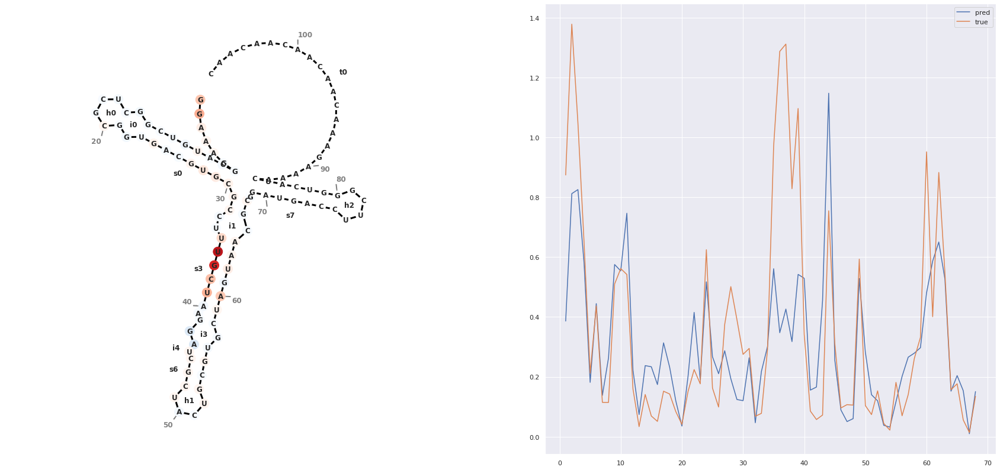

1500 4.246529372007699
[0.4868637  1.16980791 0.98695946 0.57318157 0.55732876 0.1989921
 0.15132107 0.09563516 0.29728296 0.19484387 0.10407998 0.27596554
 0.13901234 0.51804262 0.61445755 0.1975197  0.08251729 0.47139129
 1.33156788 0.19105564 0.10279095 0.36315215 0.23555349 0.86652392
 0.50301152 0.29365727 0.1383516  0.1595677  0.74654347 1.08668172
 0.78783232 0.49502823 0.21943048 0.14201806 0.34757122 0.14313605
 0.11056461 0.06697391 0.10688541 0.37586191 0.31758308 0.4460673
 0.12905084 0.49809703 1.06582522 0.74999601 0.42771459 0.50425571
 0.33914194 0.28226763 0.11065947 0.06459448 0.53806555 0.40221915
 0.08792143 0.02148519 0.08172464 1.00129831 0.79040563 0.61188895
 0.49001834 0.59935331 0.21639577 0.16086796 0.56768113 0.62716454
 0.11879841 0.17913805]


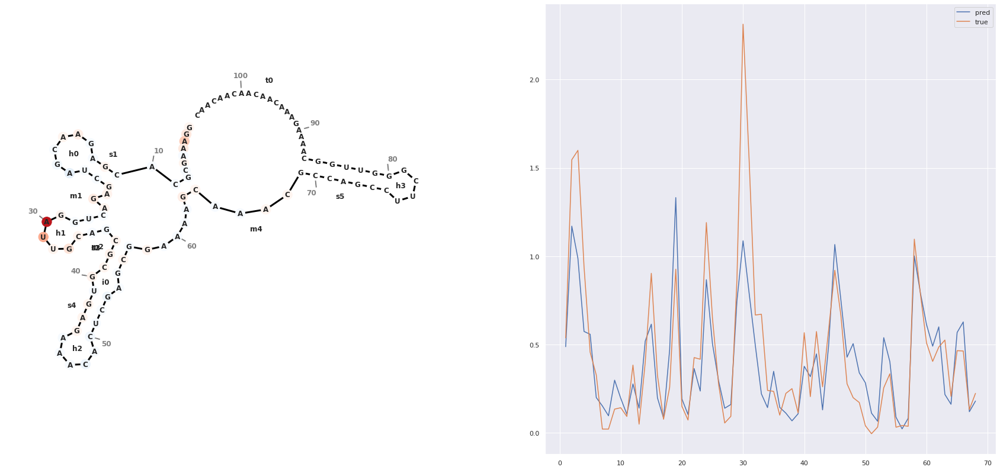

1243 4.230085433936372
[8.63674104e-01 2.03976870e+00 1.72249484e+00 1.32135463e+00
 1.86445415e-01 3.23284328e-01 4.16329727e-02 1.33922705e-02
 1.18753649e-02 8.42266060e-03 1.73735637e-02 1.74239110e-02
 6.37561083e-02 2.66900927e-01 1.88171077e+00 2.17037153e+00
 1.02771318e+00 1.19090095e-01 2.77575664e-02 2.48718914e-02
 1.22319311e-02 7.07920270e-03 2.45189201e-02 1.54032987e-02
 1.06715515e-01 5.82352579e-01 4.41984124e-02 1.43542215e-02
 7.99299780e-03 1.43817943e-02 7.67958440e-03 7.77309390e-03
 5.92402830e-03 6.21461235e-02 2.07972467e-01 4.45301354e-01
 4.65416983e-02 1.13572851e-02 1.04562892e-02 9.64638590e-03
 1.21020703e-02 4.25723419e-02 4.61133905e-02 1.46004379e-01
 1.79861033e+00 1.39106321e+00 8.77155721e-01 8.57803673e-02
 3.27857137e-02 7.08416660e-03 6.08106330e-03 2.01034270e-03
 8.05229410e-03 7.35323780e-03 3.43544185e-02 6.08097851e-01
 2.72899270e-01 1.83609165e-02 8.43307280e-03 1.23537434e-02
 7.41774590e-03 7.33111050e-03 1.41533203e-02 4.34565544e-02
 

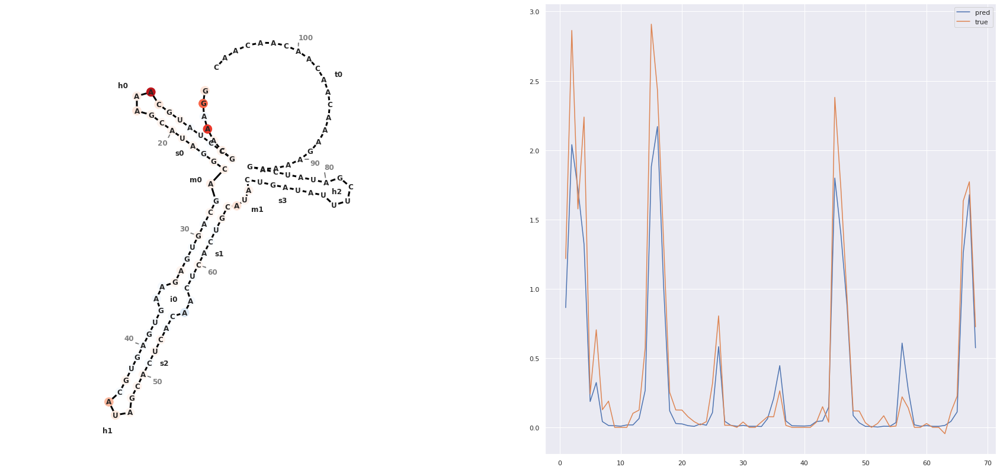

1313 4.223688434131172
[ 0.59047484  1.4681443   1.51918674  1.11206341  0.39386389  0.04268906
  0.06910094  0.10860687  0.24750644  0.06344036  0.05388783  0.0212771
  0.04608481  0.23310232  0.89916241  0.62920201  0.27731839  0.10017879
  0.07863439  0.04006998  0.08836535  0.11873415  0.09137145  0.0869384
  0.07517092  0.04465421  0.12708145  0.06259356  0.84781921  0.08181858
 -0.0021736   2.1598084   0.1510427   0.22871524  0.06500229  0.05097651
  1.10324013  0.04200508  0.28829521  0.05136944  0.06956545  0.59805524
  1.17503715  0.81607842  0.33855292  0.8497538   0.54034734  0.23599416
  0.99663961  0.39769003  0.70579088  0.26376504  0.30748585  0.20035857
  0.06102913  0.18581158  0.08924979  0.14708899  0.10022828  0.04180545
  0.31530187  0.0304135   0.01645052  1.2394042   0.09626038  0.03721077
  0.41127902  0.39722064]


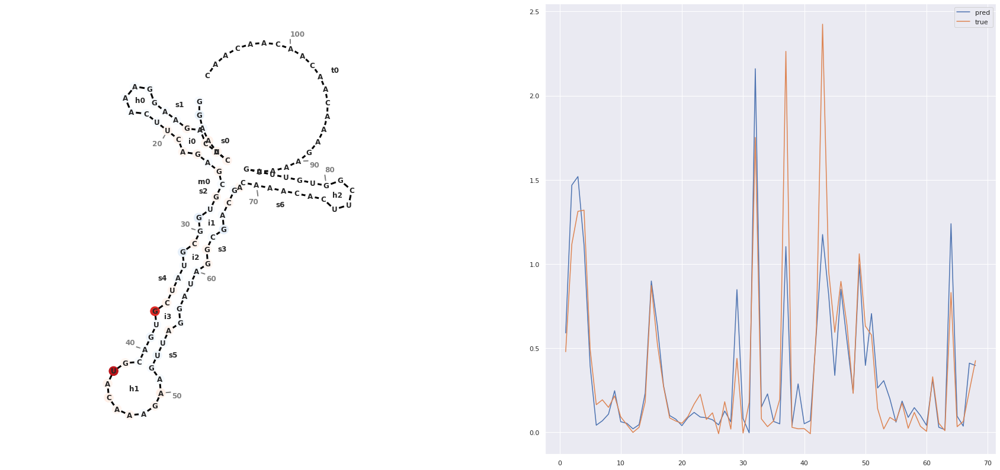

1053 4.267660559866136
[0.36762771 1.03380942 0.9695822  0.89275163 0.6545248  0.31880939
 0.40781888 0.42574245 0.19006006 0.08496438 0.50497311 0.14264932
 0.16578771 0.06961618 0.06559336 0.8363387  1.25589466 0.74809772
 0.98852217 0.8498053  0.72284991 0.43511626 0.24016877 0.54099673
 0.30481288 0.67906266 1.51363409 0.28232369 0.46565196 1.03146827
 0.11874139 0.06262429 0.14809366 0.16906002 0.24886207 0.07735648
 0.07219046 0.15675063 0.11279546 0.02445902 0.02082578 0.06515367
 0.22459245 0.51291531 0.66758341 0.85985088 0.79830265 0.59389156
 0.33910963 0.23965012 0.16506915 0.33760786 0.49971816 0.10508131
 0.28829247 0.12840526 0.14965348 0.48359916 0.54107267 0.37886301
 0.21753578 0.38544726 0.67930526 0.24206971 0.08314642 0.03489538
 0.15816788 0.27773687]


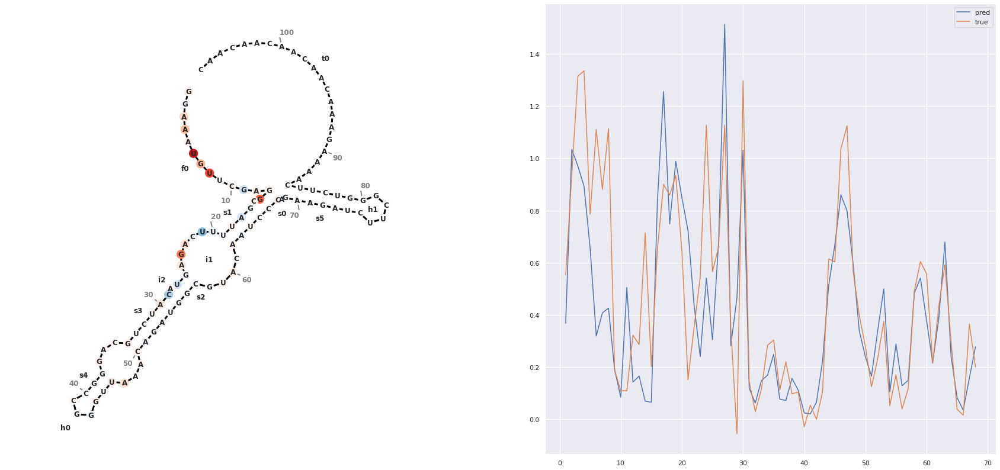

357 4.398843107543177
[ 9.48230267e-01  2.77434683e+00  1.37509894e+00  1.21579075e+00
  1.10205603e+00  5.32298386e-01  2.41029784e-02  1.15585271e-02
  1.26186144e-02  8.50433860e-03  3.98764570e-03  5.62208700e-03
  6.53568100e-03  7.79862520e-03  1.25112760e-03  3.94935530e-03
  1.75606627e-02  1.16879247e-01  4.96331900e-02  4.80970442e-02
 -1.57703403e-02  3.73808146e-02  1.48213319e-02  5.85028900e-04
  7.73821580e-03  4.77673300e-03  1.32589713e-02  1.80465910e-03
  3.15296840e-03  3.08186000e-03  5.70692100e-04 -4.36771700e-04
  6.72182100e-04  4.00452320e-03  1.22148860e-02  2.04163954e-01
  1.28630507e+00  4.29202497e-01  4.47867215e-01  3.38420607e-02
  2.11999570e-03  1.90322100e-03 -1.88282320e-03  9.51660800e-04
  3.50408070e-03  8.40449890e-03  4.33536620e-03  5.15444760e-03
  5.67535680e-03  2.90164700e-04  9.00574960e-03  6.94275090e-03
  6.23732954e-02  1.36953428e-01  2.75963831e+00  1.05088003e-01
  4.09337320e-03  8.89082440e-03  1.13658439e-02  8.63155160e-03
  1

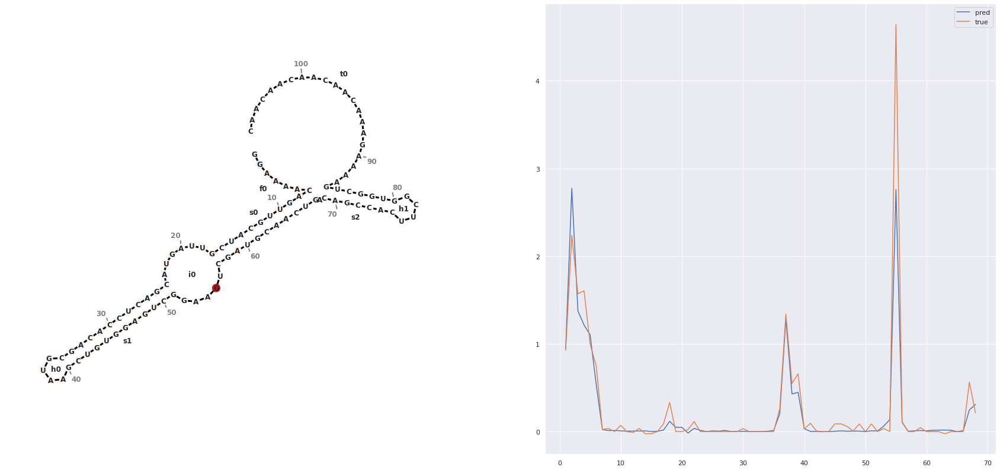

969 4.342215086766306
[ 4.48140860e-01  1.15093756e+00  1.28338861e+00  1.01359689e+00
  4.84021545e-01  3.91448826e-01  7.12085441e-02  2.61969566e-02
  4.47859243e-02  2.22498588e-02  3.04169506e-02  6.41127910e-03
  8.17135630e-03  3.43822330e-01  6.09184280e-02  4.25084949e-01
  6.78903878e-01  1.40389353e-01  7.06221312e-02  6.43454865e-02
  4.96861940e-03  1.62058268e-02  6.36845678e-02  1.18283387e-02
  1.95863321e-02  1.22250371e-01  1.08110488e-01  7.47710370e-03
  1.47092594e-02  4.15154621e-02  1.38658145e-02  2.36361120e-02
  1.60635963e-01  2.42021427e-01  1.40335560e+00  1.74785897e-01
  7.56456077e-01  4.42162245e-01  2.54203528e-01 -1.03745700e-03
  1.16143767e-02  3.62217940e-03  2.36863699e-02  3.88533026e-02
  8.83119330e-02  4.61995482e-01  1.14240718e+00  1.13397694e+00
  2.99009740e-01  2.26333305e-01  7.99906999e-02  2.29309257e-02
  2.75846254e-02  1.52998492e-02  3.61517966e-02  1.33796561e+00
  1.70088649e+00  2.56524515e+00  4.95981395e-01  1.46317852e+00
  1

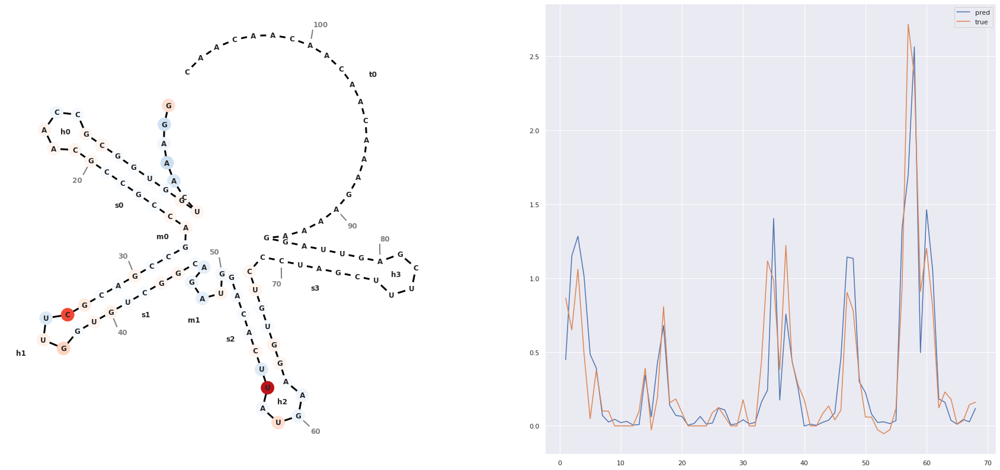

1065 4.321385405259666
[0.3900536  1.04595065 1.04499984 0.7316286  0.19211695 0.0535108
 0.08173594 0.16323355 0.38668618 0.1753186  0.09905127 0.16581032
 0.22099999 0.08598305 0.02184546 0.03551795 0.07968612 0.31766471
 0.23370305 0.46030825 0.45085692 0.14358762 0.23679487 0.49707109
 0.21142125 0.05803424 0.1091329  0.3727892  0.27610999 0.21279141
 0.40531448 0.17586908 0.22133008 0.09595874 0.12719974 0.27819866
 0.46372199 0.17439923 0.05209287 0.44590259 0.35762167 0.12548395
 0.31011987 0.15331557 0.04172053 0.24309863 0.12929265 0.11979113
 0.27934772 0.41693348 0.19405276 0.05444293 0.10963176 0.72483861
 0.52710342 0.15295157 0.35635805 0.09372088 0.25561595 0.10722476
 0.0287149  0.21503045 0.05217428 0.11301847 0.41243076 0.15508366
 0.05706369 0.0902481 ]


/media/stepan/files/projects/private/openVaccine/envs/graph/lib/python3.7/site-packages/forgi/visual/mplotlib.py:118: RuntimeWarning: invalid value encountered in true_divide
  norm_vec/=ftuv.magnitude(norm_vec)


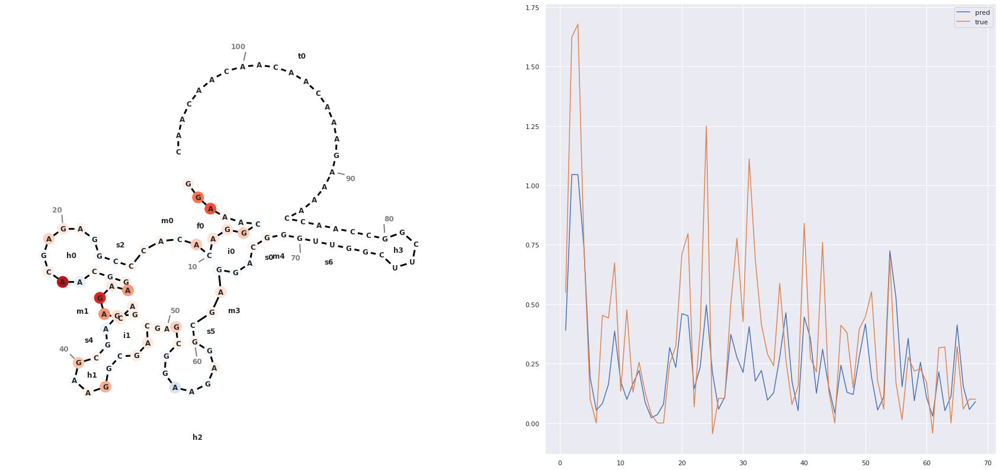

161 4.322477419599078
[0.58235794 1.23696554 1.05799198 0.94228441 0.19709955 0.04115336
 0.01802315 0.01147655 0.00190489 0.02991988 0.36299449 0.13883388
 0.05248109 0.31760868 0.58108419 0.18509935 0.19851628 0.18466634
 1.15118086 1.44896925 0.63560861 0.6116069  1.37422967 0.24451366
 0.44478107 0.43888766 0.0766094  0.04641566 0.06048516 0.84078068
 0.65931743 0.31994009 0.05237292 0.01975687 0.00384398 0.00454436
 0.1764577  0.60915869 1.65826535 0.42071438 0.03741325 0.07887446
 0.07127441 0.02945969 0.09982448 1.46511018 1.05443096 1.8640368
 0.58768517 0.27256307 0.1416613  0.09885337 0.05269397 0.07610651
 0.34351829 0.84973043 0.53958148 0.08324486 0.3759236  0.87641776
 0.36272359 0.81481439 0.11809222 0.07111059 0.11682296 0.38439116
 0.37815672 0.3105728 ]


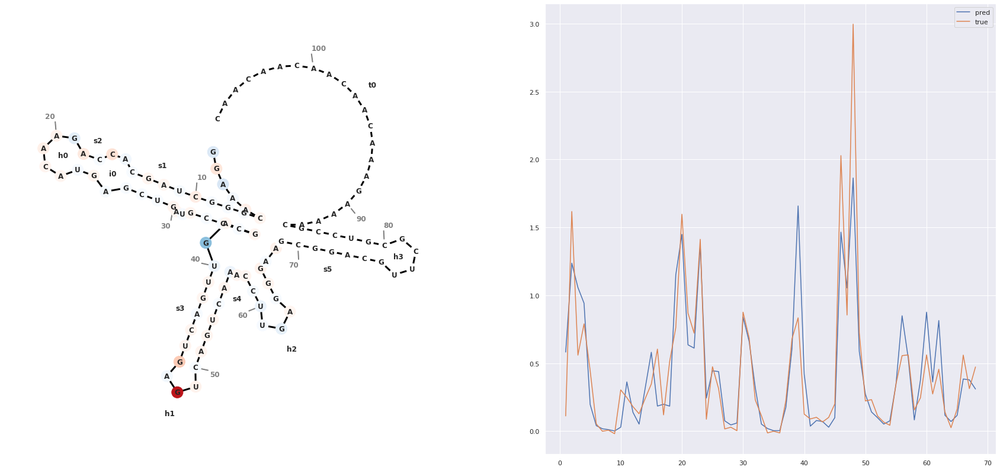

359 4.319002781612027
[ 3.45452100e-01  9.15723980e-01  1.04550540e+00  1.03028929e+00
  7.64319122e-01  2.49921307e-01  6.27530456e-01  1.26802993e+00
  7.90339768e-01  1.94557890e-01  2.14646652e-01  5.61757267e-01
  1.53212950e-01  1.28615290e-01  5.28445721e-01  2.19646379e-01
  3.46309021e-02  3.32979858e-02  1.77602112e-01  3.24665457e-01
  8.68812382e-01  3.90091091e-01  2.30796672e-02  3.37601490e-02
  6.89457580e-02 -4.64793300e-04  3.68554182e-02  7.91911125e-01
  8.68465364e-01  6.38494715e-02  1.49173126e-01  3.46130580e-01
  1.67193100e-01  5.72710000e-02  8.51783007e-02  4.94734764e-01
  1.12049294e+00  1.06817341e+00  8.14515591e-01  1.03404395e-01
  9.42941085e-02  1.70103431e-01  6.68135881e-01  1.06233513e+00
  8.71676385e-01  4.63109702e-01  3.66784453e-01  1.56054646e-01
  9.78006497e-02  1.76180080e-01  1.12768151e-01  5.77321649e-02
  3.12357005e-02  1.12692658e-02  2.42495965e-02  7.97199532e-02
  3.11990261e-01  8.90720308e-01  4.27938134e-01  6.23031668e-02
  3

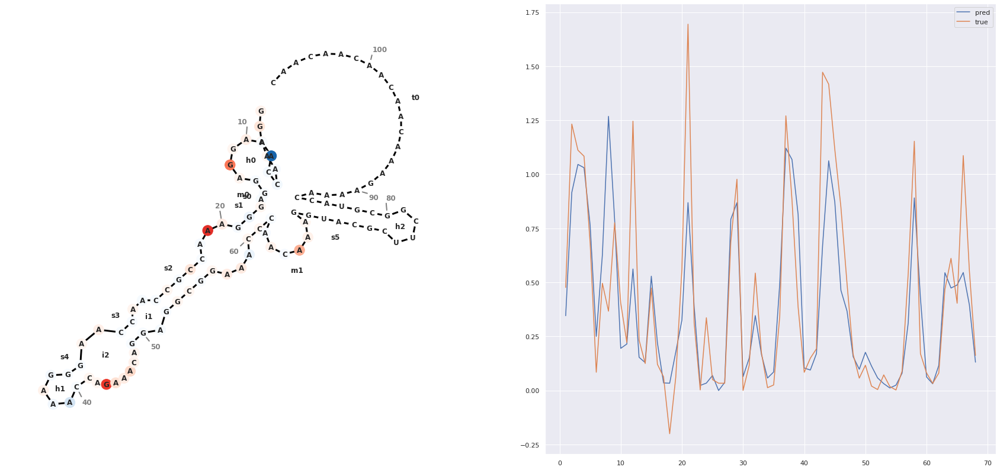

571 4.432125897186334
[0.32992274 0.87848175 0.82560539 0.53573704 0.47747001 0.18429628
 0.1008963  0.49338448 0.80803043 0.84302098 0.23106086 0.25149226
 1.05254531 0.74861658 1.03121376 0.15734676 0.17739069 0.12319733
 0.03004886 0.10138919 0.52449846 0.76810837 0.79927313 0.378371
 0.38763404 0.52179629 0.25871485 0.74924767 0.17749532 1.07059538
 0.53451705 0.31188518 0.23426142 0.28189337 0.50274277 0.86482662
 0.41792375 0.98475051 0.86552334 0.10501019 0.08718532 0.51586562
 0.16726895 0.1634419  0.58118701 0.70445901 0.32268611 0.41091192
 0.43856972 0.06912065 0.10421164 0.15146555 0.35079849 0.25810951
 0.21588567 0.43795204 0.68261522 0.31625217 0.16488168 0.33039126
 0.21647137 0.73752594 0.76828593 0.33971453 0.20840925 0.80464178
 0.42728001 0.99481648]


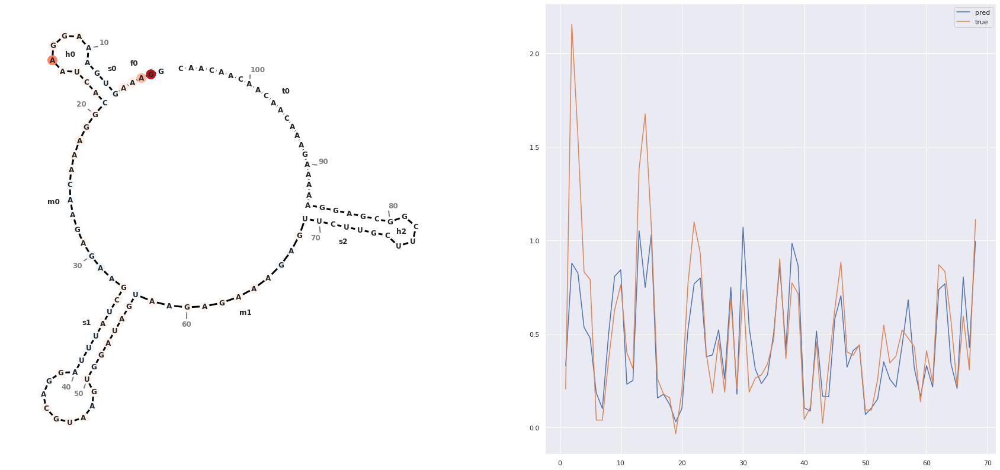

123 4.321799554669087
[0.68270779 2.48718143 1.50803685 1.15481091 1.15707695 1.31524789
 0.40932852 0.10500366 0.39624178 0.9803468  0.82827568 0.95161003
 0.90398359 0.8957656  0.91082019 0.22223806 0.06583122 0.10490568
 0.40055737 0.18527201 0.62567538 0.98048496 0.47704059 0.3260344
 1.21949708 0.81071121 0.36994821 0.92945445 0.28707817 0.13059817
 0.5737285  0.54461086 0.15978208 0.58359909 0.46521384 0.08650716
 0.03796935 0.20388995 0.38257712 0.37514383 0.87274933 0.73274946
 0.42238441 0.7992062  0.74188322 0.6360411  0.30113062 0.15079802
 0.07538172 0.04218549 0.39985988 0.33823061 0.07844941 0.51610041
 0.42665425 0.06210892 0.05602725 0.33264682 0.09298342 0.52288324
 0.50954503 0.42462373 0.29803678 0.72140825 0.55664915 0.39749357
 0.27713567 0.19694988]


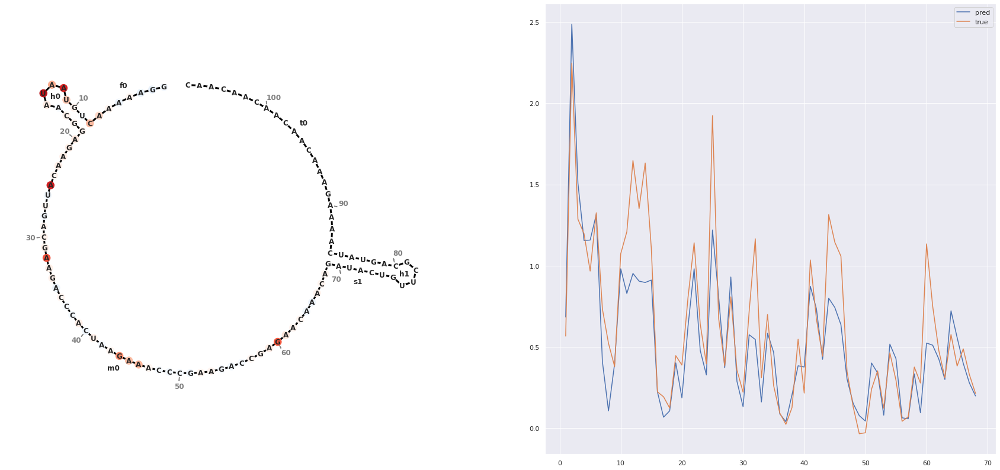

1154 4.414812150892993
[ 9.90727127e-01  2.16346669e+00  1.89806890e+00  1.14496827e+00
  4.57165003e-01  1.00977853e-01  4.76119667e-02  1.88572690e-01
  2.95183718e-01  3.73077691e-02  1.74250416e-02  9.31442082e-02
  2.97894716e-01  4.16461051e-01  7.88993910e-02  4.36555073e-02
  4.40226719e-02  3.13185066e-01  3.04043949e-01  2.24170893e-01
  1.11655079e-01  6.99392408e-02  1.22706771e-01  2.47347713e-01
  8.69555593e-01  5.91683626e-01  2.24676043e-01  9.20899808e-02
  2.83996388e-02  3.89718622e-01  6.08659685e-01  1.10671967e-01
  3.78049016e-01  3.32355440e-01  4.66892421e-01  4.94112492e-01
  1.39951742e+00  7.08815038e-01  1.87872171e-01  2.11600885e-01
  9.14804697e-01  1.61849499e-01  5.48499897e-02  2.35811025e-02
  5.15788123e-02  8.76905918e-02  4.87916082e-01  4.58558321e-01
  3.76815170e-01  3.08025837e-01  3.37223932e-02  1.29724983e-02
 -3.81311100e-04  2.03118831e-01  1.87706158e-01  2.65810192e-01
  4.15230244e-02  3.28702331e-02  8.18263441e-02  3.02602589e-01
  

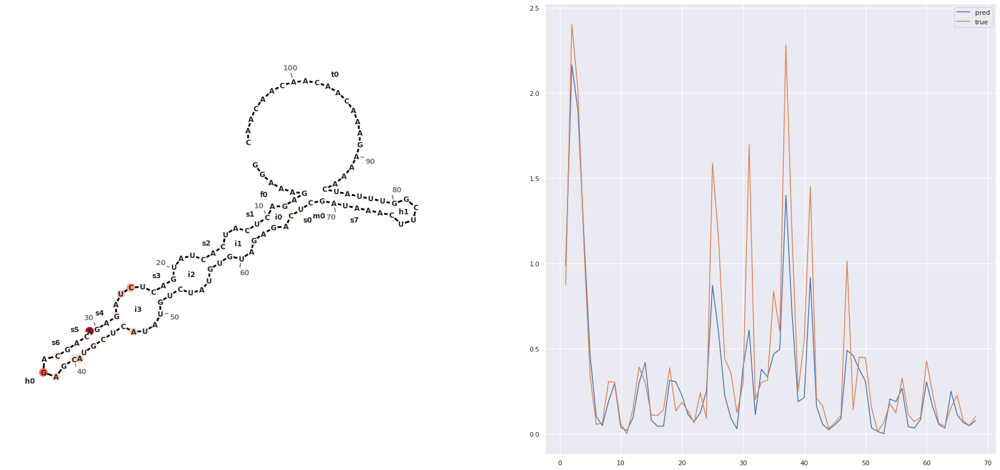

In [35]:
mean_err = cv_reactivity_error.sum(axis=1)
for i in np.argpartition(mean_err,1300)[1300:1320]:
    print(i, mean_err[i])
    plot_errors(i)

808 4.5167007604135545


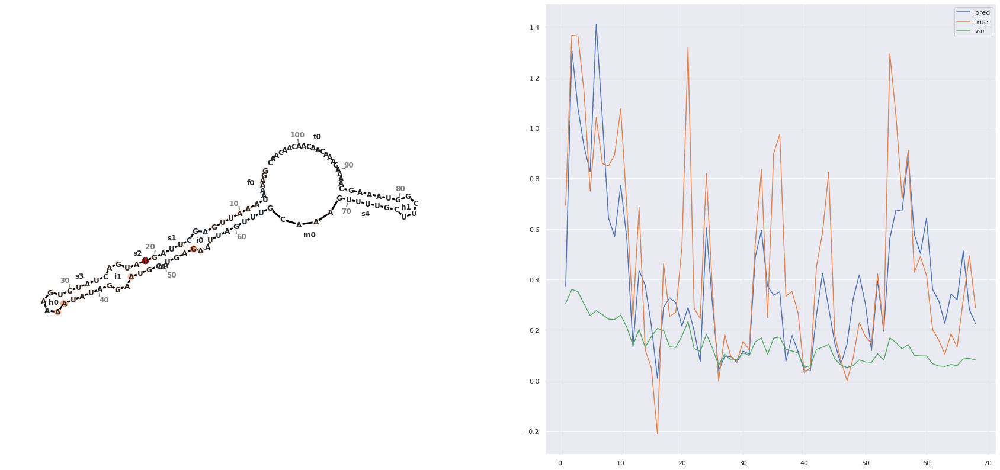

606 4.543637113018815


/media/stepan/files/projects/private/openVaccine/envs/graph/lib/python3.7/site-packages/forgi/visual/mplotlib.py:118: RuntimeWarning: invalid value encountered in true_divide
  norm_vec/=ftuv.magnitude(norm_vec)


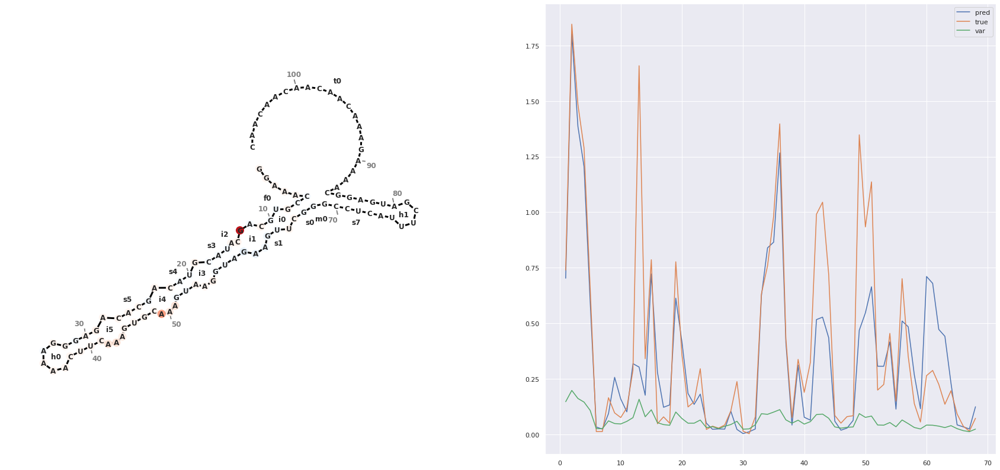

6 4.538572306174076


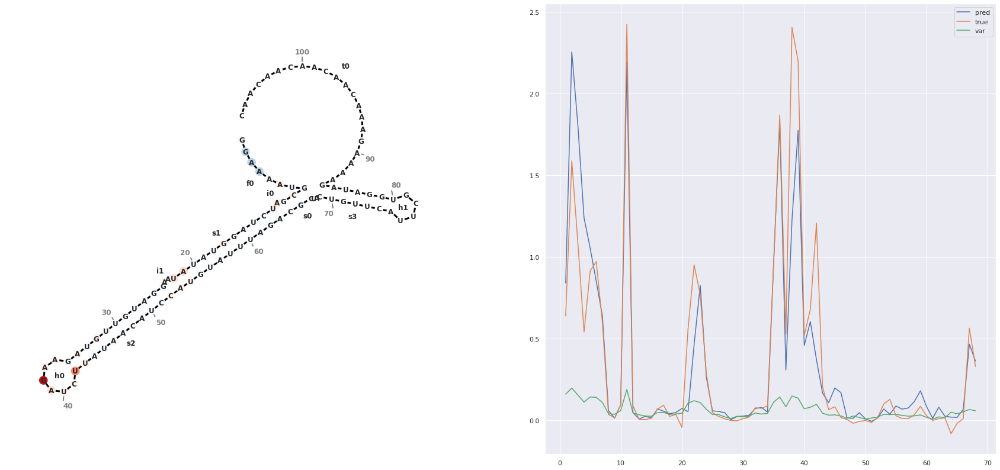

1034 4.548216315641536


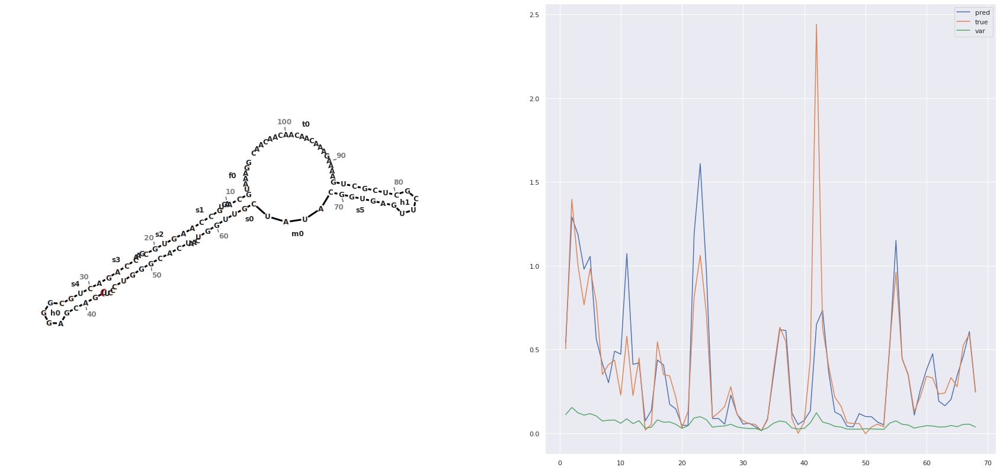

29 4.57738895028795


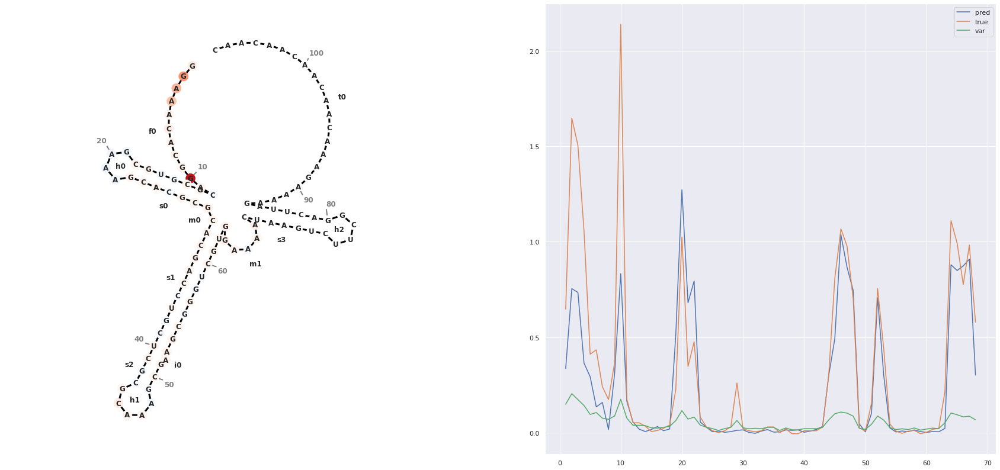

866 4.56027687935582


/media/stepan/files/projects/private/openVaccine/envs/graph/lib/python3.7/site-packages/forgi/visual/mplotlib.py:118: RuntimeWarning: invalid value encountered in true_divide
  norm_vec/=ftuv.magnitude(norm_vec)


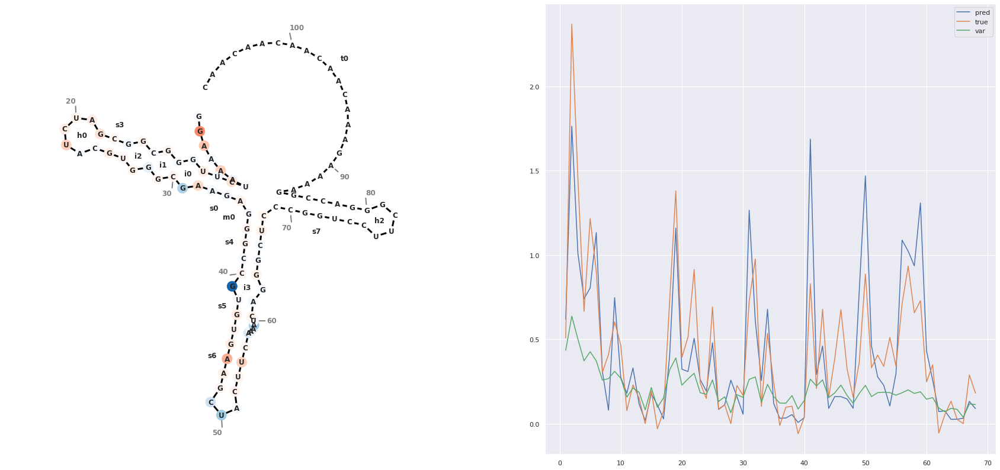

1243 4.584057621228353


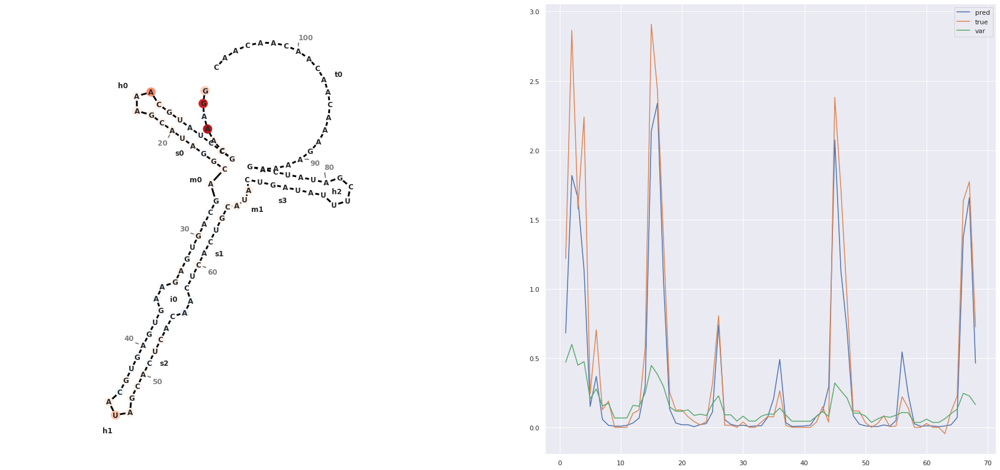

1423 4.5989705072981195


/media/stepan/files/projects/private/openVaccine/envs/graph/lib/python3.7/site-packages/forgi/visual/mplotlib.py:118: RuntimeWarning: invalid value encountered in true_divide
  norm_vec/=ftuv.magnitude(norm_vec)


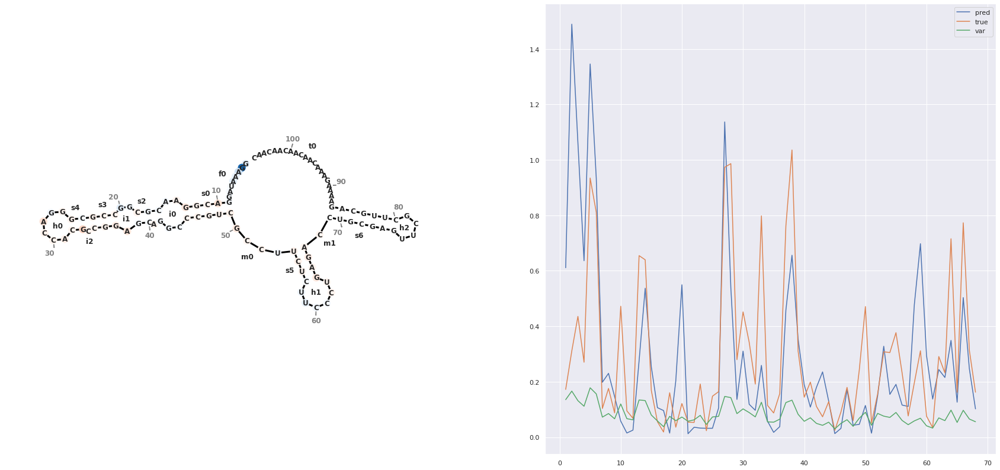

772 4.555547244311166


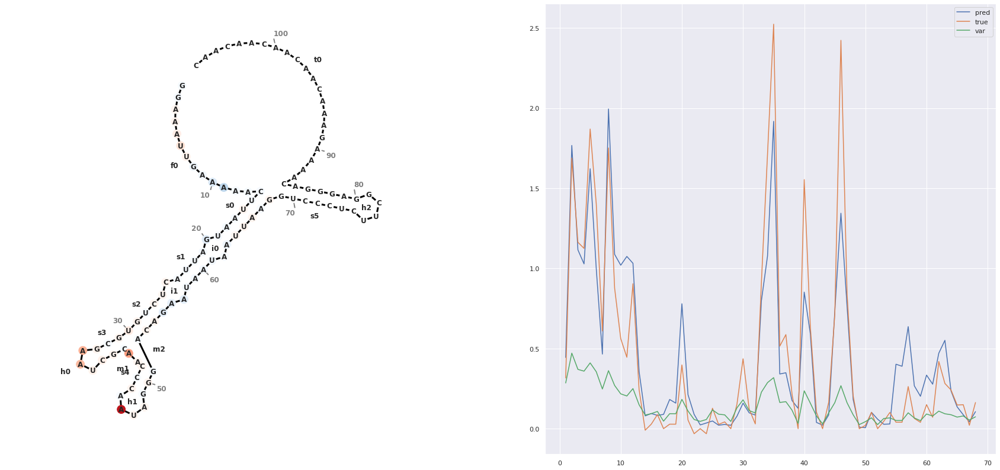

214 4.608061343353586


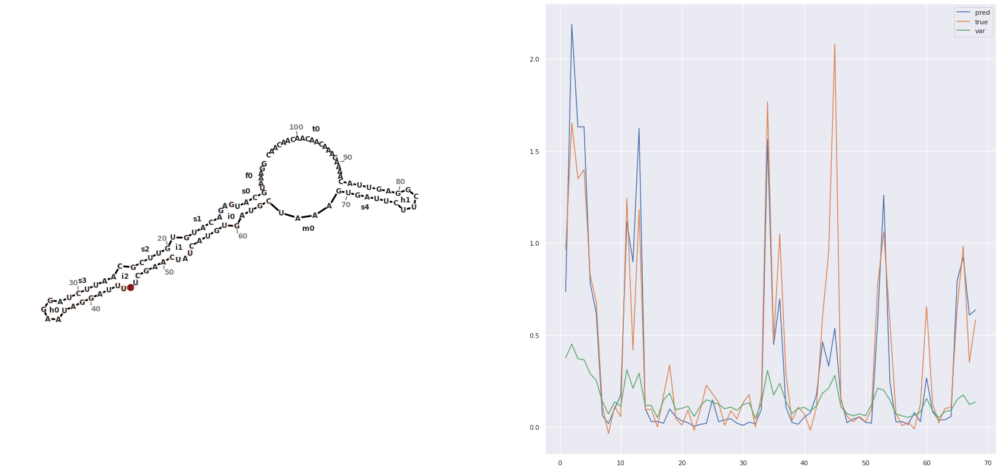

8 4.824145378474951


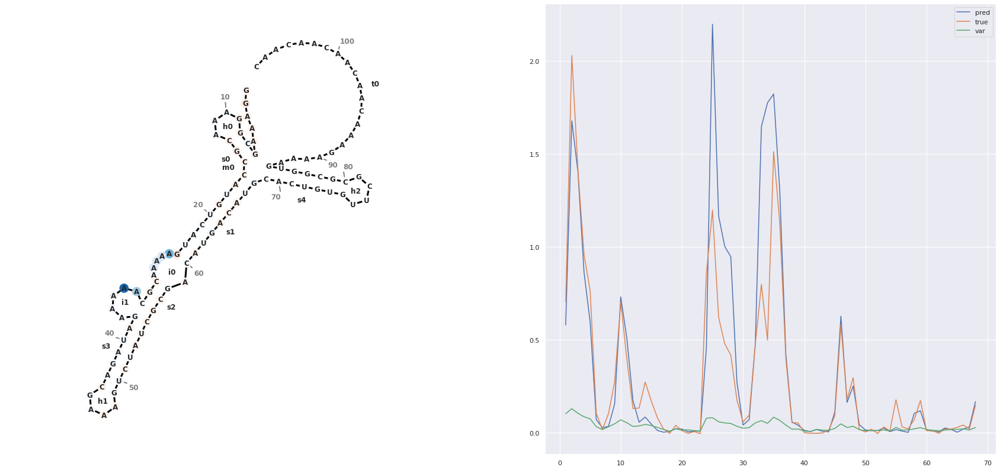

998 5.001753299265779


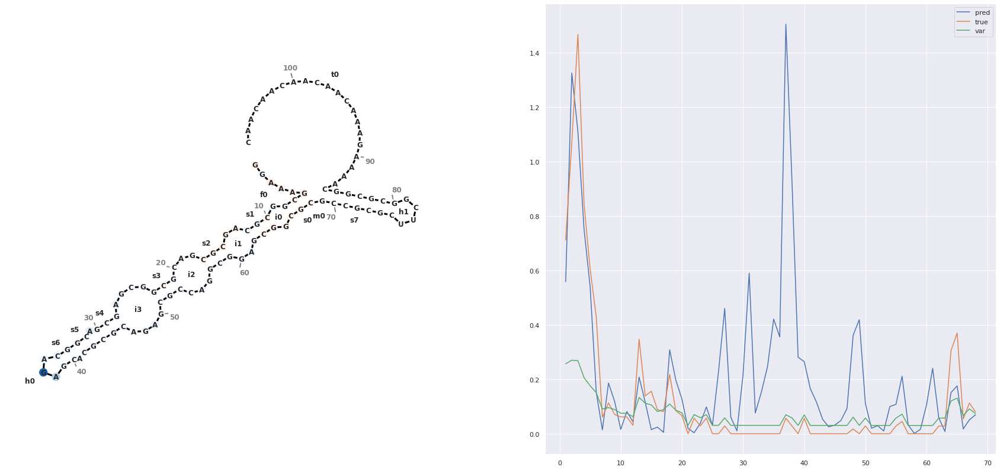

9 5.485046230798582


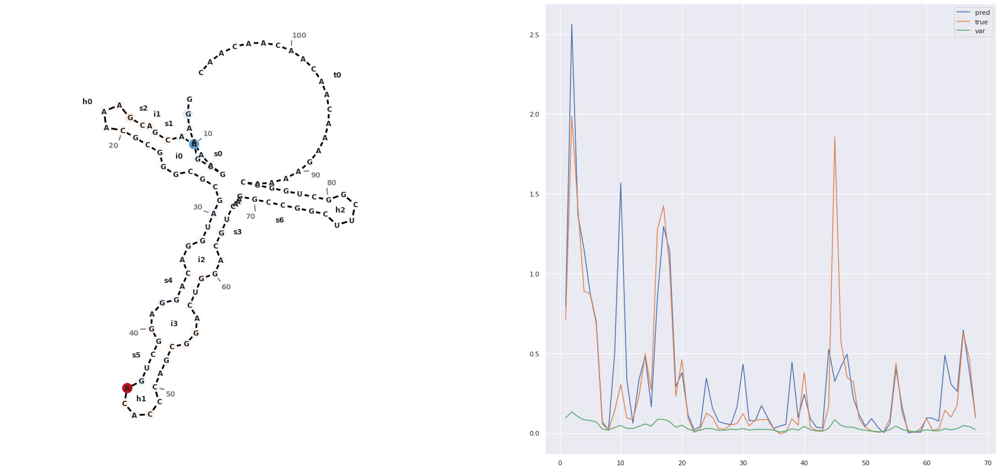

1313 5.160193496443101


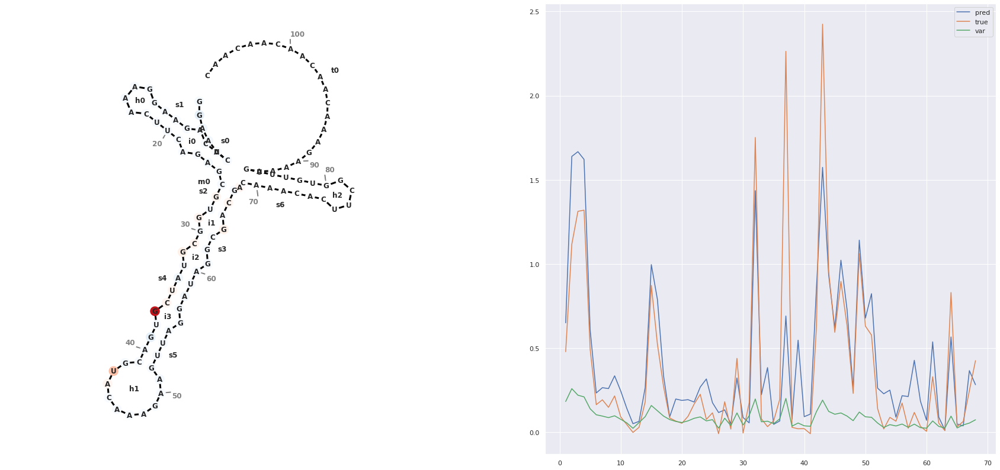

1302 4.8872990690463105


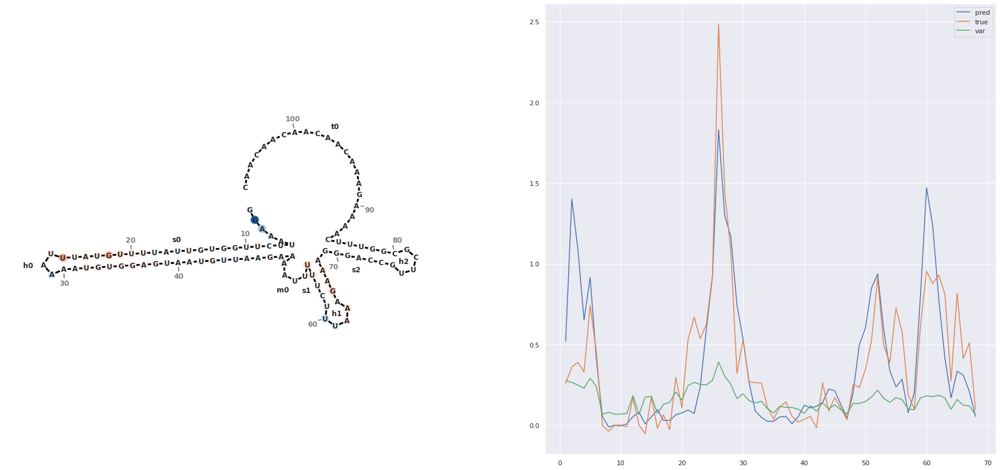

153 4.8436873168966015


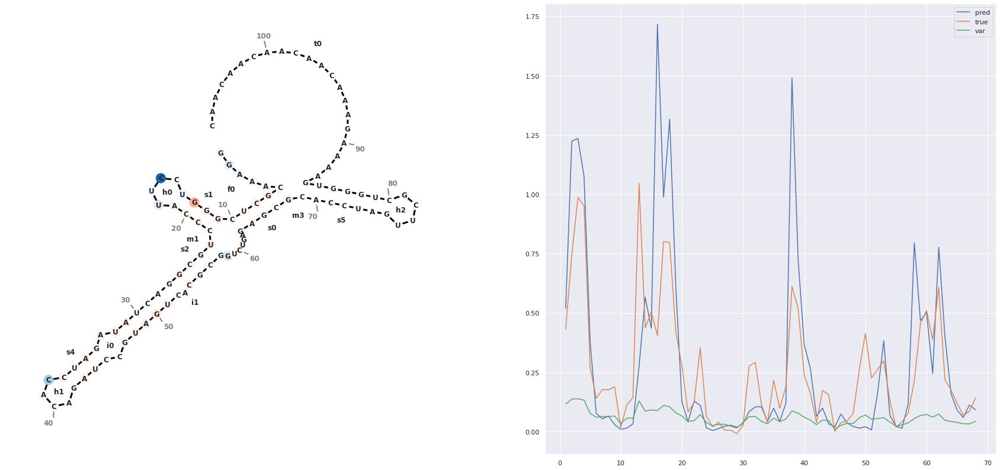

775 5.497084149513984


/media/stepan/files/projects/private/openVaccine/envs/graph/lib/python3.7/site-packages/forgi/visual/mplotlib.py:118: RuntimeWarning: invalid value encountered in true_divide
  norm_vec/=ftuv.magnitude(norm_vec)


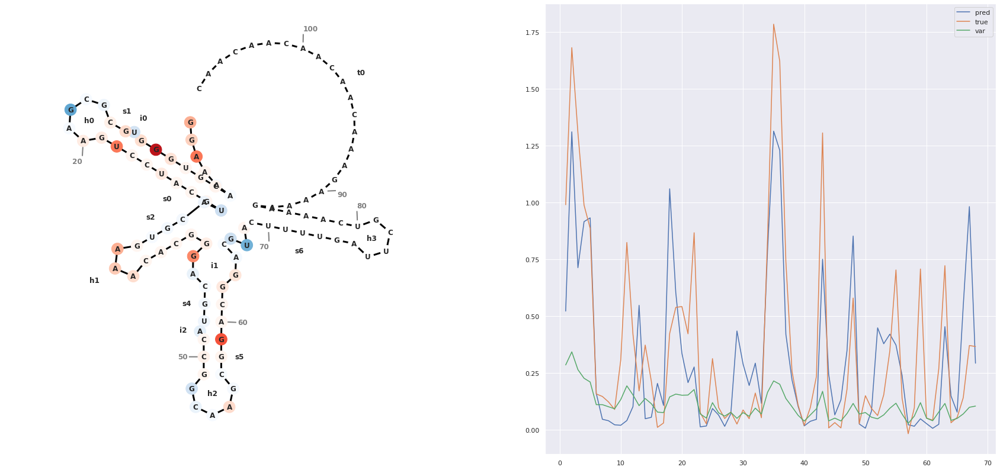

1297 4.914710087190047


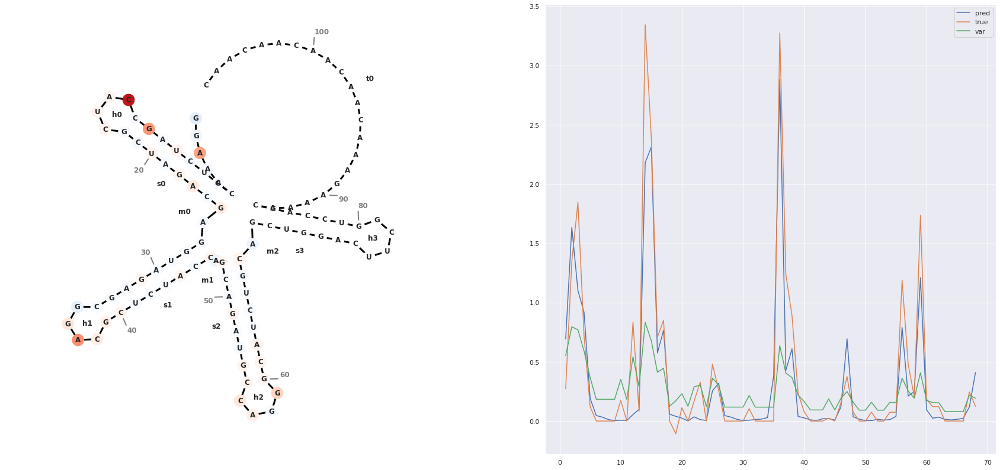

82 4.9438447599323325


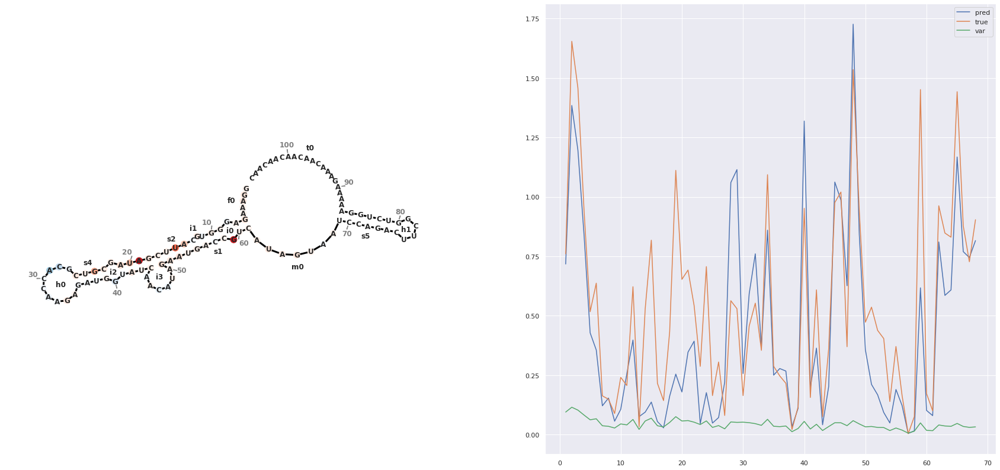

338 5.106716426050008


/media/stepan/files/projects/private/openVaccine/envs/graph/lib/python3.7/site-packages/forgi/visual/mplotlib.py:118: RuntimeWarning: invalid value encountered in true_divide
  norm_vec/=ftuv.magnitude(norm_vec)


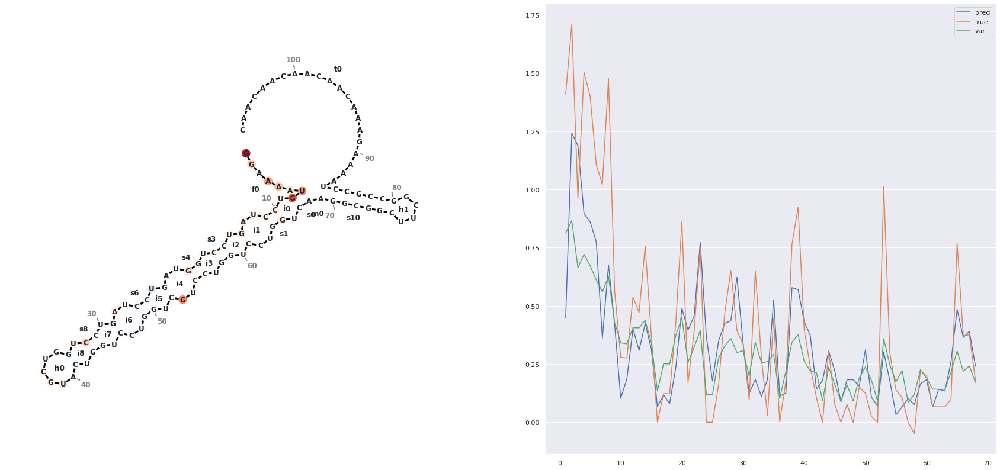

In [201]:
for i in np.argpartition(mean_err,1300)[1300:1320]:
    print(i, mean_err[i])
    plot_errors(i)

In [167]:
''.join(sequences[775])

'GGAAAACGUGGGUGCGCGAAGUCCUACGUACGUGAAACACGGGACGUACCGGCAAGCGGACGGACGUACUUUUGAUUCGUCAAAAGAAAAGAAACAACAACAACAAC'

In [124]:
bpp = np.load("../data/bpps/id_000ae4237.npy")

In [128]:
bpp.mean(0)[0:1], bpp.sum(0)[0:1]

(array([0.00177286]), array([0.23047123]))

In [132]:
np.expand_dims(bpp.sum(0),1).shape

(130, 1)

/media/stepan/files/projects/private/openVaccine/envs/graph/lib/python3.7/site-packages/forgi/visual/mplotlib.py:118: RuntimeWarning: invalid value encountered in true_divide
  norm_vec/=ftuv.magnitude(norm_vec)


[0.3900536  1.04595065 1.04499984 0.7316286  0.19211695 0.0535108
 0.08173594 0.16323355 0.38668618 0.1753186  0.09905127 0.16581032
 0.22099999 0.08598305 0.02184546 0.03551795 0.07968612 0.31766471
 0.23370305 0.46030825 0.45085692 0.14358762 0.23679487 0.49707109
 0.21142125 0.05803424 0.1091329  0.3727892  0.27610999 0.21279141
 0.40531448 0.17586908 0.22133008 0.09595874 0.12719974 0.27819866
 0.46372199 0.17439923 0.05209287 0.44590259 0.35762167 0.12548395
 0.31011987 0.15331557 0.04172053 0.24309863 0.12929265 0.11979113
 0.27934772 0.41693348 0.19405276 0.05444293 0.10963176 0.72483861
 0.52710342 0.15295157 0.35635805 0.09372088 0.25561595 0.10722476
 0.0287149  0.21503045 0.05217428 0.11301847 0.41243076 0.15508366
 0.05706369 0.0902481 ]


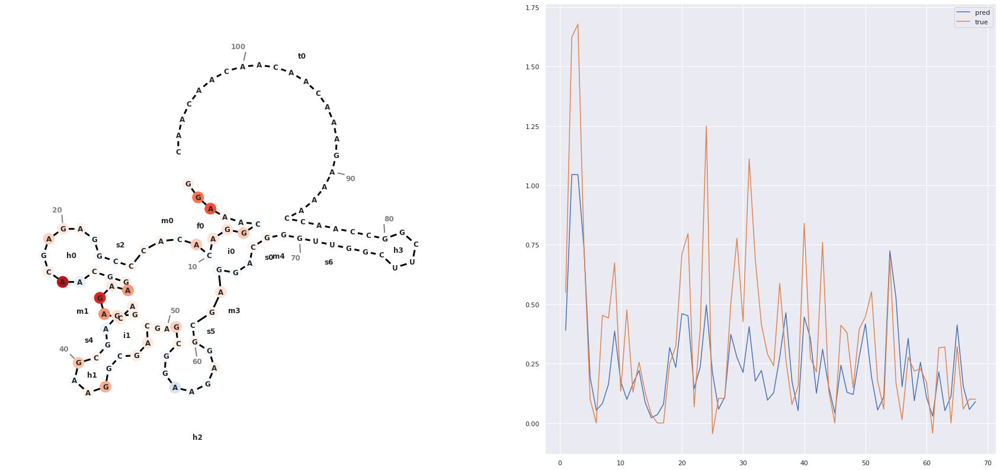

In [40]:
plot_errors(1065)

In [38]:
structure = "......................(((((((..(((........)))..............))))))).(((((((((..)))))))))...................."

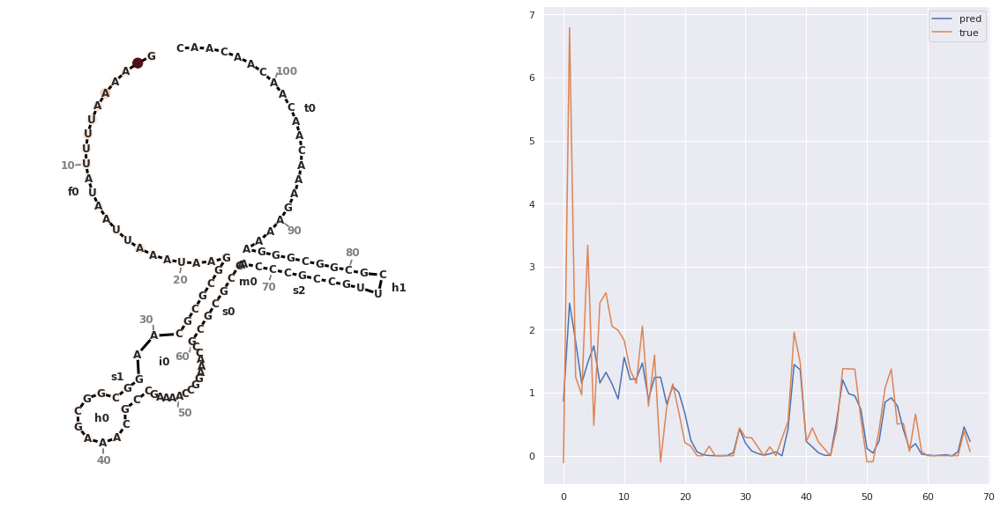

In [39]:
fa = '\n'.join([">0",sequence,structure])
bg, = fgb.BulgeGraph.from_fasta_text(fa)

fig, (ax,ax2) = plt.subplots(figsize=(20,10),ncols=2)
plot_rna(bg,ax, text_kwargs={"fontweight":"black"}, lighten=0.7,
             backbone_kwargs={"linewidth":3},color=True
         , colors=colors
        )
ax2.plot(range(68),cv_reactivity[i],label='pred')
ax2.plot(range(68),reactivity[i],label='true')
ax2.legend()
plt.show()

In [ ]:
cv_de

In [ ]:
colors

In [ ]:
errors/errors.max()

In [ ]:
colors

In [3]:
import json

In [4]:
with open('../data/sampled_structures.json') as f:
    sampled_structures = json.load(f)

In [5]:
for recs in sampled_structures.values():
    for rec in recs:
        rec['energy'] = float(rec['energy'])

In [10]:
with open('../data/sampled_structures.json','w') as f:
    json.dump(sampled_structures, f)

In [12]:
sorted(sampled_structures['id_001f94081'],key=lambda d: d['energy'], reverse=False)

[{'structure': '.....((((((.......)))).)).((.....((..((((((....))))))..)).....))....(((((((....))))))).....................',
  'energy': -18.9,
  'loop_type': ['f',
   'f',
   'f',
   'f',
   'f',
   's',
   's',
   's',
   's',
   's',
   's',
   'h',
   'h',
   'h',
   'h',
   'h',
   'h',
   'h',
   's',
   's',
   's',
   's',
   'i',
   's',
   's',
   'm',
   's',
   's',
   'i',
   'i',
   'i',
   'i',
   'i',
   's',
   's',
   'i',
   'i',
   's',
   's',
   's',
   's',
   's',
   's',
   'h',
   'h',
   'h',
   'h',
   's',
   's',
   's',
   's',
   's',
   's',
   'i',
   'i',
   's',
   's',
   'i',
   'i',
   'i',
   'i',
   'i',
   's',
   's',
   'm',
   'm',
   'm',
   'm',
   's',
   's',
   's',
   's',
   's',
   's',
   's',
   'h',
   'h',
   'h',
   'h',
   's',
   's',
   's',
   's',
   's',
   's',
   's',
   't',
   't',
   't',
   't',
   't',
   't',
   't',
   't',
   't',
   't',
   't',
   't',
   't',
   't',
   't',
   't',
   't',
   't',
   't',
  

In [177]:
cv_reactivity_error.mean(axis=1).shape

(1589,)

In [192]:
num_samples_df = pd.DataFrame({"samples":num_structures, "err":cv_deg_mg_ph_error.mean(axis=1)})

In [193]:
num_samples_df.samples = num_samples_df.samples.clip(upper=5)

<AxesSubplot:xlabel='samples', ylabel='err'>

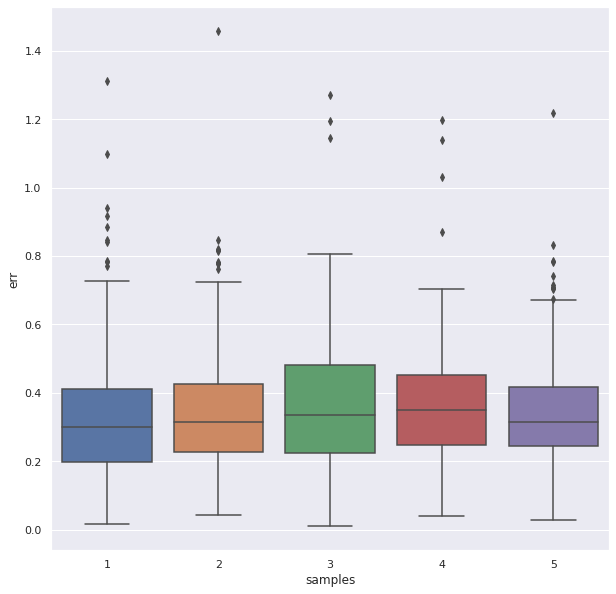

In [194]:
fig, ax = plt.subplots(figsize=(10,10))
sns.boxplot(data=num_samples_df,x='samples', y='err', ax=ax)